In [2]:
import scanpy as sc
import pandas as pd 
import numpy as np
from scipy.sparse import csr_matrix
import matplotlib.pyplot as plt
import warnings
from nero import Harmonia

In [16]:
# might need this, the most recent version of jupterlab I installed installed the most recent version of jedi which has been having problems with autocomplete
# see thread here: https://github.com/ipython/ipython/issues/10493
%config Completer.use_jedi = False

sc.settings.verbosity = 4
sc.settings.set_figure_params(dpi=80)

In [17]:
prefix = '/data/jupyter/191205_hm_1um/'

#HTO_classification = pd.read_csv('/wynton/group/ye/byungjin/mux_abseq/191224_novaseq/191205_v1_1_hm_1um_HTO_classification.csv',sep=',')

In [18]:
h5_path = prefix + 'filtered_feature_bc_matrix.h5'
# demux_path = prefix + 'cramore/demux.output.best'
#vireo_path = '/data/191224_low_donor_ids.tsv'

In [19]:
#mymux = Harmonia.MuxOut(demux_path)
#mymux = Harmonia.MuxOut(vireo_path)

In [20]:
#print(mymux.num_drops)
#print(mymux.sngrate)
#print(mymux.dblrate)
#print(mymux.ambrate)

In [21]:
raw_adata = sc.read_10x_h5(h5_path, gex_only=False) # need gex_only = False otherwise the custom feature barcodes don't show up
raw_adata.var_names_make_unique()

reading /data/jupyter/191205_hm_1um/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)


In [22]:
adata = raw_adata.copy()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [23]:
cell_adata = adata

In [24]:
cell_adata

AnnData object with n_obs × n_vars = 8765 × 112141 
    var: 'gene_ids', 'feature_types', 'genome'

In [25]:
bcs = list(cell_adata.obs.index)

In [26]:
#filter HTO classifications to match current dimensions and add identity column
gem = pd.read_csv("/data/jupyter/191205_hm_1um/191205_v1.1_gem_classification.csv")
raw_gem_classification=gem[gem['barcode'].isin(bcs)]
raw_gem_classification=raw_gem_classification.set_index('barcode')
cell_adata.obs['identity']=raw_gem_classification['recall']

Extract out singlets and doublets only.

In [27]:
#sngdbls = mymux.sngdbl()[['DROPLET.TYPE','BEST.GUESS']]
#cells = sngdbls.loc[np.intersect1d(adata.obs_names.values,sngdbls.index.values,assume_unique=True),:]

Subset for singlets and doublets, and make some useful covariates.

In [28]:
#cell_adata = adata[cells.index].copy()
#cell_adata.obs['DROPTYPE'] = cells['DROPLET.TYPE']
#cell_adata.obs['IND'] = cells['BEST.GUESS']

Remove platelets and RBCs.

In [29]:
#mat = csr_matrix(cell_adata.X) # convert the underlying data matrix into a compressed sparse row matrix
#mat = np.array(mat[:, cell_adata.var_names.isin(['PPBP'])].todense()).flatten() # get the counts of PPBP in each cell`
#counts, nums = np.unique(mat,return_counts=True) #confirm we won't lose all of our cells
#list(zip(nums,counts))

In [30]:
#cell_adata = cell_adata[mat <= 1].copy()

In [31]:
#mat = csr_matrix(cell_adata.X) # convert the underlying data matrix into a compressed sparse row matrix
#mat = np.array(mat[:, cell_adata.var_names.isin(['HBB'])].todense()).flatten() # get the counts of PPBP in each cell`
#counts, nums = np.unique(mat,return_counts=True) #confirm we won't lose all of our cells
#list(zip(nums,counts))

In [32]:
#cell_adata = cell_adata[mat < 1].copy()

In [33]:
cell_adata.var

,gene_ids,feature_types,genome
hg19_DDX11L1,hg19_ENSG00000223972,Gene Expression,hg19
hg19_WASH7P,hg19_ENSG00000227232,Gene Expression,hg19
hg19_MIR1302-10,hg19_ENSG00000243485,Gene Expression,hg19
hg19_FAM138A,hg19_ENSG00000237613,Gene Expression,hg19
hg19_OR4G4P,hg19_ENSG00000268020,Gene Expression,hg19
...,...,...,...
mm10_CAAA01147332.1,mm10_ENSMUSG00000095742,Gene Expression,mm10
CD29h_barcode1,Ab1CD29h,Antibody Capture,
CD29h_barcode2,Ab2CD29h,Antibody Capture,
CD29m_barcode1,Ab1CD29m,Antibody Capture,


Get percentage mitochondria.

In [34]:
genelist = cell_adata.var_names.tolist()
mito_genes_names = [gn for gn in genelist if gn.startswith('hg19_MT-')] + [gn for gn in genelist if gn.startswith('mm10_mt-')]
mito_genes = [genelist.index(gn) for gn in mito_genes_names]
cell_adata.obs['percent_mito'] = np.ravel(np.sum(cell_adata[:, mito_genes].X, axis=1)) / np.ravel(np.sum(cell_adata.X, axis=1))

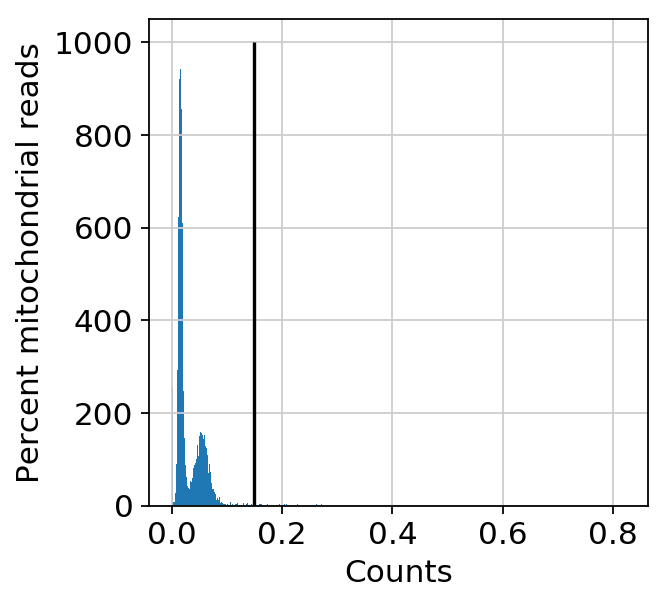

In [35]:
plt.hist(cell_adata.obs['percent_mito'].values,bins=500)
plt.vlines(0.15,0,1000);
plt.xlabel('Counts')
plt.ylabel('Percent mitochondrial reads');
# plt.xlim((0,0.1));

Only keep cells with low `percent_mito`.

In [36]:
cutoff = 0.15
cell_adata = cell_adata[cell_adata.obs['percent_mito'] < cutoff].copy()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [37]:
cell_adata

AnnData object with n_obs × n_vars = 8618 × 112141 
    obs: 'identity', 'percent_mito'
    var: 'gene_ids', 'feature_types', 'genome'

Examine the number of genes expressed per cell.

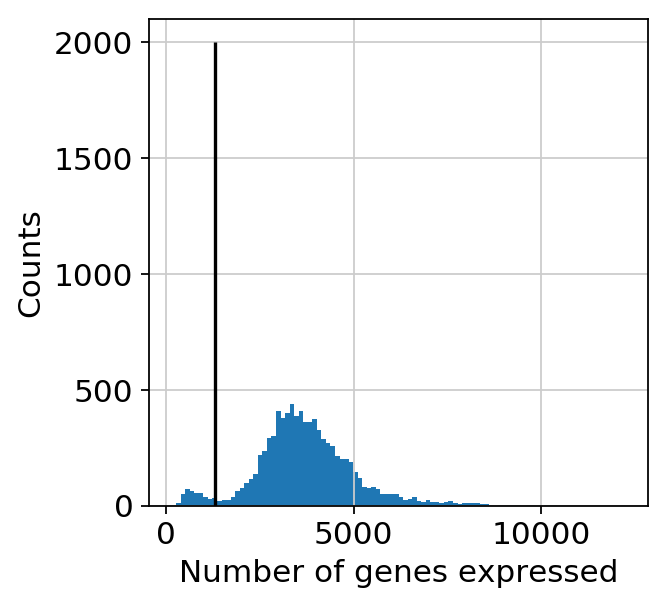

In [38]:
plt.hist(sc.pp.filter_cells(cell_adata, min_genes=0,inplace=False)[1],bins=100); # just to get out the number of genes expressed per cell
plt.ylabel('Counts')
plt.xlabel('Number of genes expressed');
plt.vlines(1300,0,2000);

I won't filter anything out here, but this may very well be a gauge for the doublets.

Standard processing here:

In [39]:
sc.pp.filter_genes(cell_adata,min_counts=1)

filtered out 63281 genes that are detected in less than 1 counts


In [40]:
cell_adata

AnnData object with n_obs × n_vars = 8618 × 48860 
    obs: 'identity', 'percent_mito'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts'

In [41]:
cell_adata.var.tail(4)

,gene_ids,feature_types,genome,n_counts
CD29h_barcode1,Ab1CD29h,Antibody Capture,,7499504.0
CD29h_barcode2,Ab2CD29h,Antibody Capture,,3505821.0
CD29m_barcode1,Ab1CD29m,Antibody Capture,,3948382.0
CD29m_barcode2,Ab2CD29m,Antibody Capture,,1358083.0


In [42]:
cell_adata.obs

,identity,percent_mito
AAACCCAAGGGTACAC-1,mm10,0.002102
AAACCCAAGTCTGCGC-1,mm10,0.018944
AAACCCAAGTTGGCGA-1,hg19,0.062494
AAACCCACAACCGGAA-1,Multiplet,0.049401
AAACCCACAGAGTTCT-1,mm10,0.015764
...,...,...
TTTGTTGCACATAACC-1,mm10,0.001926
TTTGTTGCATCATTTC-1,mm10,0.010071
TTTGTTGTCATCTCTA-1,hg19,0.046824
TTTGTTGTCCATTGTT-1,mm10,0.015356


# Scatterplot  based on ADT counts¶

In [43]:
df_CD29h_1 = cell_adata[:,'CD29h_barcode1'].to_df()
df_CD29h_2 = cell_adata[:,'CD29h_barcode2'].to_df()

df_CD29m_1 = cell_adata[:,'CD29m_barcode1'].to_df()
df_CD29m_2 = cell_adata[:,'CD29m_barcode2'].to_df()

df_CD29h_merged = df_CD29h_1.join(df_CD29h_2)
df_CD29m_merged = df_CD29m_1.join(df_CD29m_2)

df_CD29h_merged['CD29_h_merged'] = df_CD29h_merged.sum(axis=1)
df_CD29m_merged['CD29_m_merged'] = df_CD29m_merged.sum(axis=1)

df_CD29hm_merged = df_CD29h_merged.join(df_CD29m_merged)
#type(cell_adata.obs['call'])
df_CD29hm_merged = df_CD29hm_merged.join(cell_adata.obs)

In [60]:
df_CD29hm_merged.head()

,CD29h_barcode1,CD29h_barcode2,CD29_h_merged,CD29m_barcode1,CD29m_barcode2,CD29_m_merged,identity,percent_mito
AAACCCAAGGGTACAC-1,21.0,27.0,48.0,501.0,22.0,523.0,mm10,0.002102
AAACCCAAGTCTGCGC-1,19.0,36.0,55.0,41.0,513.0,554.0,mm10,0.018944
AAACCCAAGTTGGCGA-1,4111.0,27.0,4138.0,43.0,26.0,69.0,hg19,0.062494
AAACCCACAACCGGAA-1,6956.0,31.0,6987.0,634.0,20.0,654.0,Multiplet,0.049401
AAACCCACAGAGTTCT-1,26.0,16.0,42.0,972.0,11.0,983.0,mm10,0.015764


In [25]:
df_CD29hm_merged.to_csv("191205_merged_raw_counts.txt")

In [26]:
df_CD29hm_merged.shape

(8618, 8)

In [61]:
df_CD29hm_merged[df_CD29hm_merged['identity'] =='Multiplet'].shape[0]

322

In [63]:
total = df_CD29hm_merged['CD29_h_merged'] + df_CD29hm_merged['CD29_m_merged']

hf = df_CD29hm_merged['CD29_h_merged']  / total
mf = df_CD29hm_merged['CD29_m_merged'] / total

df_hf = pd.DataFrame(hf)
df_mf = pd.DataFrame(mf)

#df_hsum = pd.DataFrame(hsum)
#df_msum = pd.DataFrame(msum)

df_hf.columns = ['Human_adt_Fraction']
df_mf.columns = ["Mouse_adt_Fraction"]

#df_hsum.columns = ['Human_tx_Fraction']
#df_msum.columns = ["Mouse_tx_Fraction"]

df_fin_adt = df_hf.join(df_mf)
#df_plot_tx = df_hsum.join([df_msum])
# a = 1 if i<100 else 2 if i>100 else 0

#hindex = df_fin_tx['Human_tx_Fraction']>=0.9
#mindex = df_fin_tx['Mouse_tx_Fraction']>=0.9
#dindex = (df_fin_tx['Human_tx_Fraction']<0.9) & (df_fin_tx['Mouse_tx_Fraction']<0.9)

#df.loc[df['set_of_numbers'] <= 4, 'equal_or_lower_than_4?'] = 'True' 
#df.loc[df['set_of_numbers'] > 4, 'equal_or_lower_than_4?'] = 'False' 

df_fin_adt.head()

df_fin_adt.loc[df_fin_adt['Human_adt_Fraction']>=0.7, 'identity'] = 'Human'
df_fin_adt.loc[df_fin_adt['Mouse_adt_Fraction']>=0.7, 'identity'] = 'Mouse'
df_fin_adt.loc[(df_fin_adt['Human_adt_Fraction']<0.7) & (df_fin_adt['Mouse_adt_Fraction']<0.7), 'identity'] = 'Multiplet'

df_fin_adt[df_fin_adt['identity']=='Multiplet'].shape[0]/df_fin_adt.shape[0]
#df_CD29hm_merged.loc[df_CD29hm_merged['CD29_h_merged']>=0.9, 'identity'] = 'Human'
#df_CD29hm_merged.loc[df_CD29hm_merged['CD29_m_merged']>=0.9, 'identity'] = 'Mouse'
#df_CD29hm_merged.loc[(df_CD29hm_merged['CD29_h_merged']<0.9) & (df_CD29hm_merged['CD29_m_merged']<0.9), 'identity'] = 'Multiplet'
#df_fin_tx['identity'] = np.where(df_fin_tx['Human_tx_Fraction']>=0.9, 'Human', 'Multiplet')
#df_fin_tx['identity'] = np.where(df_fin_tx['Mouse_tx_Fraction']>=0.9, 'Mouse', 'Multiplet')


0.03631933163146902

# Z-score norm or log1p + zscore

In [44]:
#df_call2 = df_CD4_20_h_merged['recall']
df_identity = df_CD29hm_merged['identity']

df_drop = df_CD29hm_merged.drop(['identity'],axis=1)

df_log1p=df_drop.apply(np.log1p)

log_znorm_df=(df_log1p-df_log1p.mean())/df_log1p.std()

In [45]:
df_fin=log_znorm_df.join([df_identity])

In [32]:
df_fin.head()

,CD29h_barcode1,CD29h_barcode2,CD29_h_merged,CD29m_barcode1,CD29m_barcode2,CD29_m_merged,percent_mito,identity
AAACCCAAGGGTACAC-1,-0.512480,-0.401151,-0.720389,0.859530,-0.492629,0.424492,-1.272825,mm10
AAACCCAAGTCTGCGC-1,-0.560204,-0.229725,-0.652124,-0.671365,1.591181,0.468181,-0.492330,mm10
AAACCCAAGTTGGCGA-1,2.106599,-0.401151,1.547625,-0.642659,-0.385081,-1.105640,1.467543,hg19
AAACCCACAACCGGAA-1,2.369898,-0.319021,1.815377,1.004555,-0.553648,0.594109,0.886876,Multiplet
AAACCCACAGAGTTCT-1,-0.409935,-0.708063,-0.787166,1.267893,-0.929005,0.903473,-0.638725,mm10


In [40]:
df_fin[df_fin['identity']=='Multiplet'].shape[0] / df_fin.shape[0]

0.037363657461127874

In [44]:
df_fin.to_csv("191205_v1.1_CD29hm_2batch_log_zscore_column_summary_matrix.csv")

# supple figures...

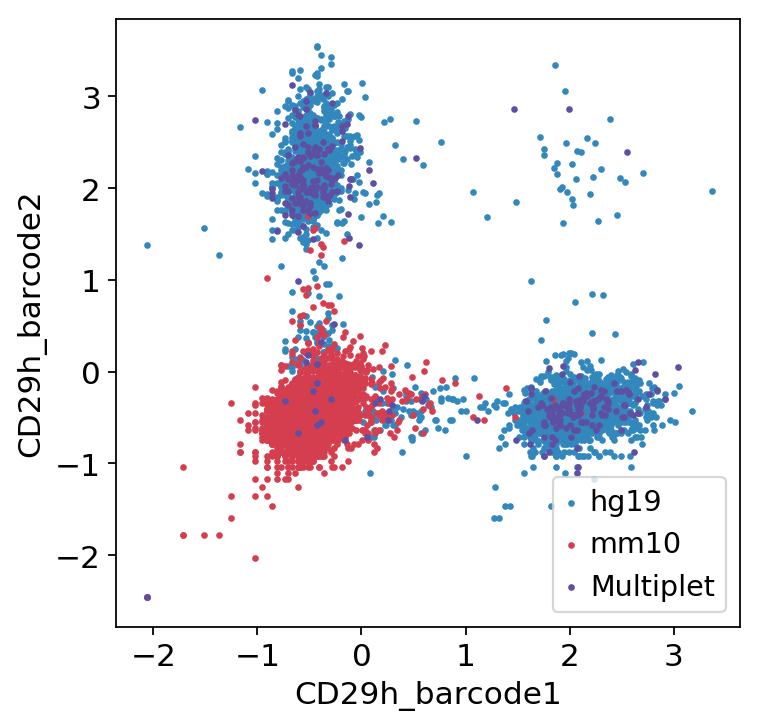

In [48]:
import pandas as pd
import seaborn as sns

plt.figure(figsize=(5,5))
a=df_fin[df_fin['identity']=='hg19']
b=df_fin[df_fin['identity']=='mm10']
c=df_fin[df_fin['identity']=='Multiplet']

s=sns.scatterplot(x="CD29h_barcode1", y="CD29h_barcode2", data=a, s=20, marker='.', edgecolor=None, color='#3288BD', zorder=1, label="hg19")
s=sns.scatterplot(x="CD29h_barcode1", y="CD29h_barcode2", data=b, s=20, marker='.', edgecolor=None, color='#D53E4F', zorder=2, label="mm10")
s=sns.scatterplot(x="CD29h_barcode1", y="CD29h_barcode2", data=c, s=20, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Multiplet")

s.grid(False)

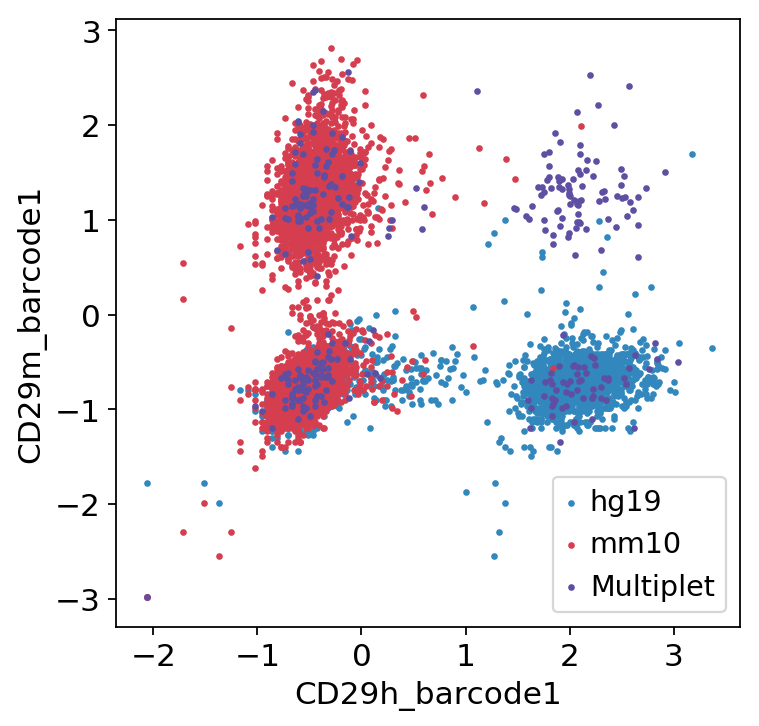

In [49]:
import pandas as pd
import seaborn as sns

plt.figure(figsize=(5,5))
a=df_fin[df_fin['identity']=='hg19']
b=df_fin[df_fin['identity']=='mm10']
c=df_fin[df_fin['identity']=='Multiplet']

s=sns.scatterplot(x="CD29h_barcode1", y="CD29m_barcode1", data=a, s=20, marker='.', edgecolor=None, color='#3288BD', zorder=1, label="hg19")
s=sns.scatterplot(x="CD29h_barcode1", y="CD29m_barcode1", data=b, s=20, marker='.', edgecolor=None, color='#D53E4F', zorder=2, label="mm10")
s=sns.scatterplot(x="CD29h_barcode1", y="CD29m_barcode1", data=c, s=20, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Multiplet")

s.grid(False)

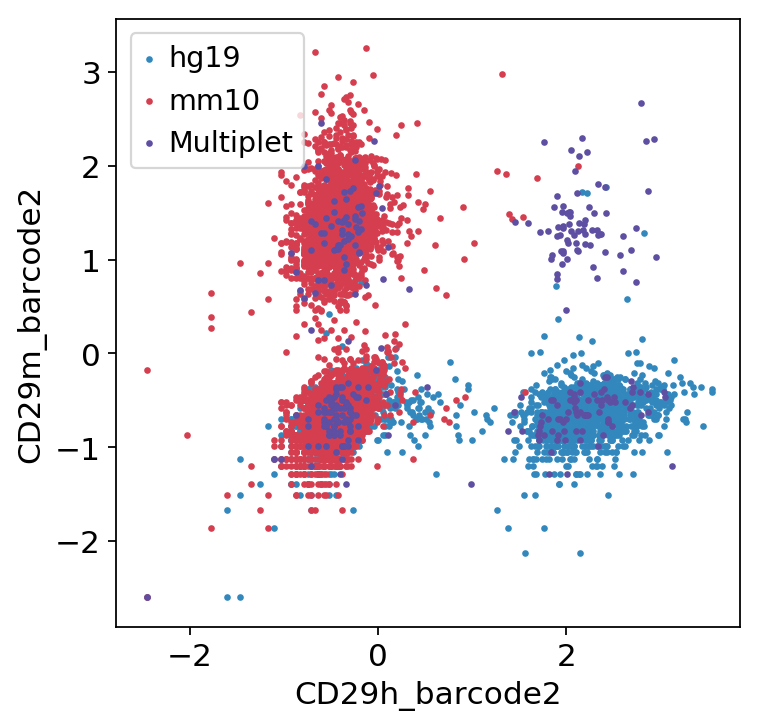

In [50]:
import pandas as pd
import seaborn as sns

plt.figure(figsize=(5,5))
a=df_fin[df_fin['identity']=='hg19']
b=df_fin[df_fin['identity']=='mm10']
c=df_fin[df_fin['identity']=='Multiplet']

s=sns.scatterplot(x="CD29h_barcode2", y="CD29m_barcode2", data=a, s=20, marker='.', edgecolor=None, color='#3288BD', zorder=1, label="hg19")
s=sns.scatterplot(x="CD29h_barcode2", y="CD29m_barcode2", data=b, s=20, marker='.', edgecolor=None, color='#D53E4F', zorder=2, label="mm10")
s=sns.scatterplot(x="CD29h_barcode2", y="CD29m_barcode2", data=c, s=20, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Multiplet")

s.grid(False)

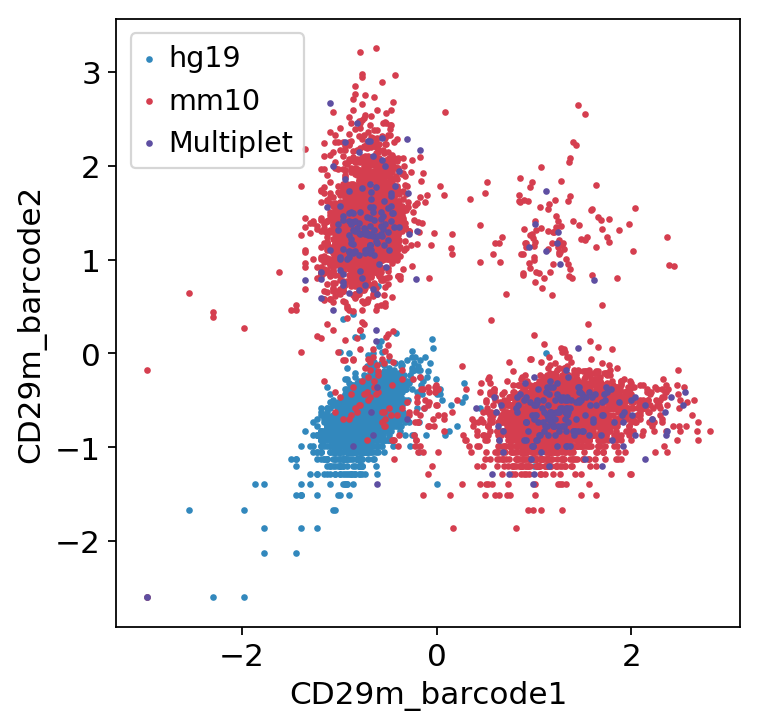

In [51]:
import pandas as pd
import seaborn as sns

plt.figure(figsize=(5,5))
a=df_fin[df_fin['identity']=='hg19']
b=df_fin[df_fin['identity']=='mm10']
c=df_fin[df_fin['identity']=='Multiplet']

s=sns.scatterplot(x="CD29m_barcode1", y="CD29m_barcode2", data=a, s=20, marker='.', edgecolor=None, color='#3288BD', zorder=1, label="hg19")
s=sns.scatterplot(x="CD29m_barcode1", y="CD29m_barcode2", data=b, s=20, marker='.', edgecolor=None, color='#D53E4F', zorder=2, label="mm10")
s=sns.scatterplot(x="CD29m_barcode1", y="CD29m_barcode2", data=c, s=20, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Multiplet")

s.grid(False)

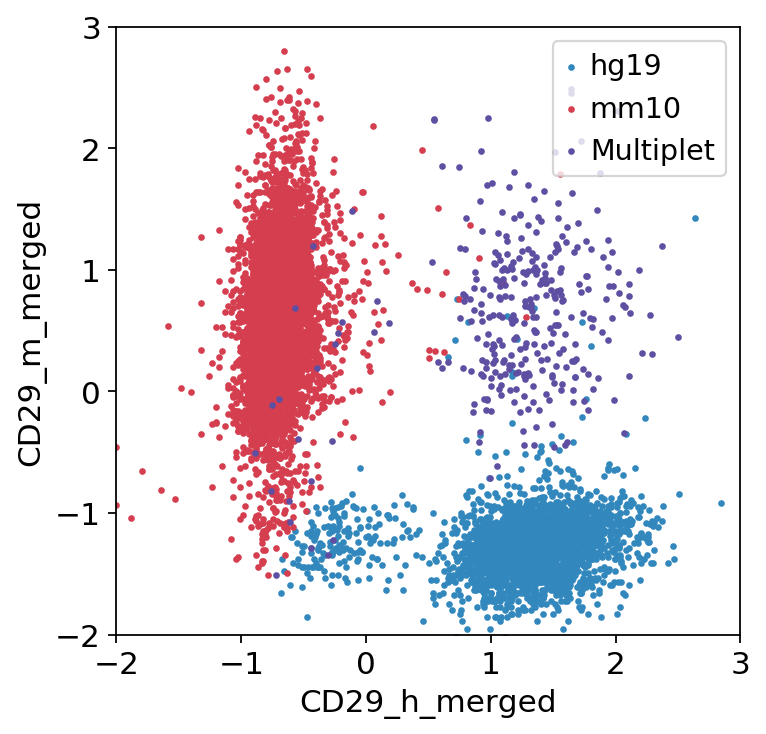

In [42]:
import pandas as pd
import seaborn as sns

plt.figure(figsize=(5,5))
a=df_fin[df_fin['identity']=='hg19']
b=df_fin[df_fin['identity']=='mm10']
c=df_fin[df_fin['identity']=='Multiplet']

s=sns.scatterplot(x="CD29_h_merged", y="CD29_m_merged", data=a, s=20, marker='.', edgecolor=None, color='#3288BD', zorder=1, label="hg19")
s=sns.scatterplot(x="CD29_h_merged", y="CD29_m_merged", data=b, s=20, marker='.', edgecolor=None, color='#D53E4F', zorder=2, label="mm10")
s=sns.scatterplot(x="CD29_h_merged", y="CD29_m_merged", data=c, s=20, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Multiplet")

plt.xlim(-2,3)
plt.ylim(-2,3)
s.grid(False)

f = s.get_figure()
f.savefig("191205_v1.1_20K_h_m_merged_tx_group_plot.png")

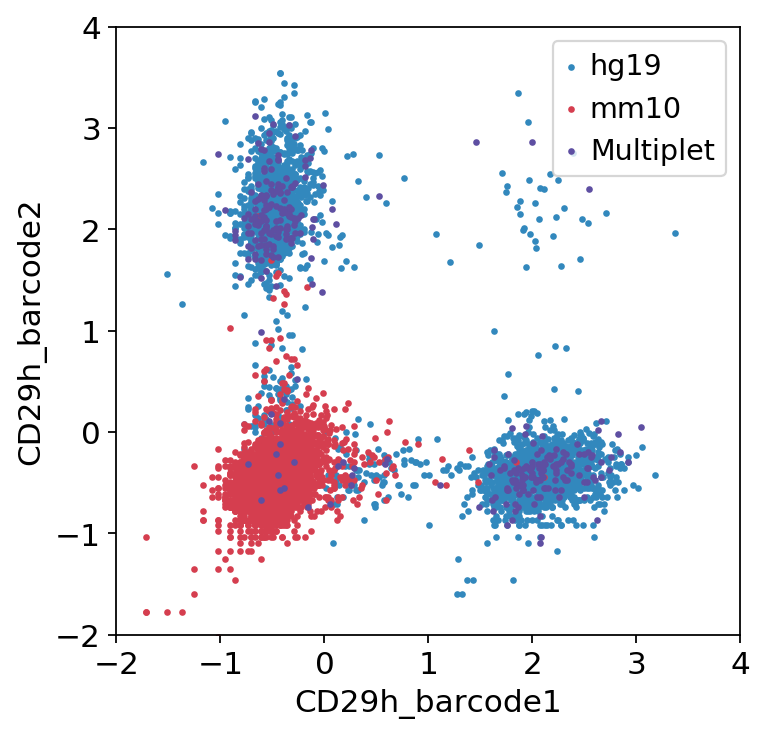

In [68]:
import pandas as pd
import seaborn as sns

plt.figure(figsize=(5,5))
a=df_fin[df_fin['identity']=='hg19']
b=df_fin[df_fin['identity']=='mm10']
c=df_fin[df_fin['identity']=='Multiplet']

s=sns.scatterplot(x="CD29h_barcode1", y="CD29h_barcode2", data=a, s=20, marker='.', edgecolor=None, color='#3288BD', zorder=1, label="hg19")
s=sns.scatterplot(x="CD29h_barcode1", y="CD29h_barcode2", data=b, s=20, marker='.', edgecolor=None, color='#D53E4F', zorder=2, label="mm10")
s=sns.scatterplot(x="CD29h_barcode1", y="CD29h_barcode2", data=c, s=20, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Multiplet")

plt.xlim(-2,4)
plt.ylim(-2,4)
s.grid(False)

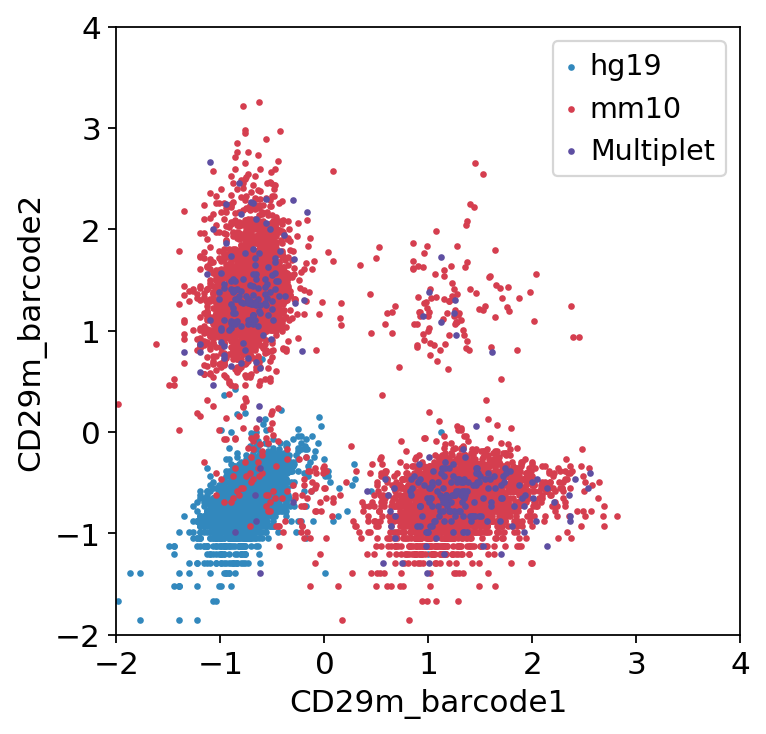

In [69]:
import pandas as pd
import seaborn as sns

plt.figure(figsize=(5,5))
a=df_fin[df_fin['identity']=='hg19']
b=df_fin[df_fin['identity']=='mm10']
c=df_fin[df_fin['identity']=='Multiplet']

s=sns.scatterplot(x="CD29m_barcode1", y="CD29m_barcode2", data=a, s=20, marker='.', edgecolor=None, color='#3288BD', zorder=1, label="hg19")
s=sns.scatterplot(x="CD29m_barcode1", y="CD29m_barcode2", data=b, s=20, marker='.', edgecolor=None, color='#D53E4F', zorder=2, label="mm10")
s=sns.scatterplot(x="CD29m_barcode1", y="CD29m_barcode2", data=c, s=20, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Multiplet")

plt.xlim(-2,4)
plt.ylim(-2,4)
s.grid(False)

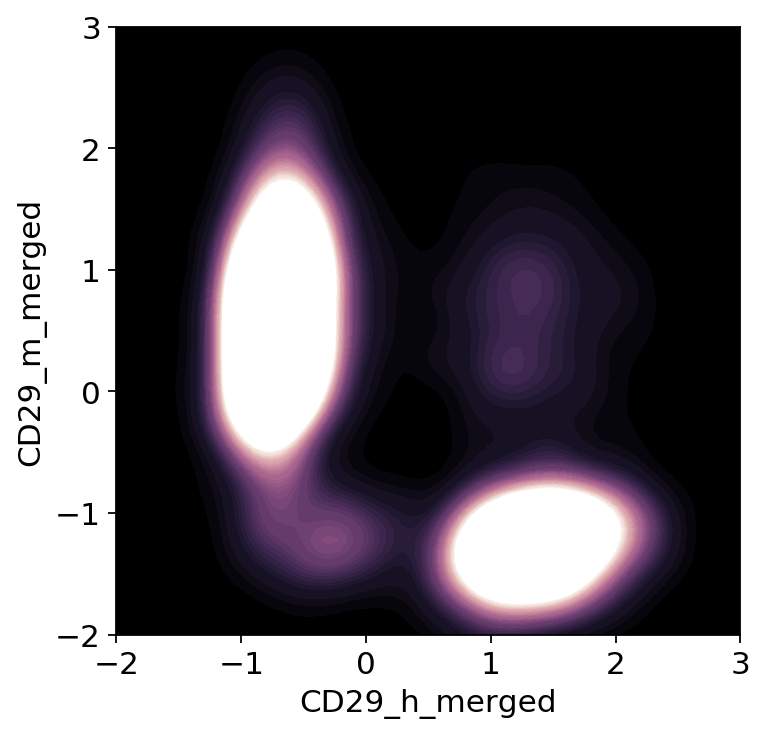

In [40]:
f, ax = plt.subplots(figsize=(5, 5))
cmap = sns.cubehelix_palette(as_cmap=True, dark=0, light=7, reverse=True)
g=sns.kdeplot(df_fin.CD29_h_merged, df_fin.CD29_m_merged, cmap=cmap, n_levels=300, shade=True);
plt.autoscale(True)
g.set(ylim=(-2,3))
g.set(xlim=(-2,3))
g.grid(False)

f = g.get_figure()
f.savefig("191205_v1.1_20K_h_m_unresolved_density_plot.png")

# resolution plots

In [9]:
df_log_z_resolved = pd.read_table("191205_v1.1_1um_CD29hm_low_2batch_summary_resolved.txt", sep="\t")

In [10]:
df_log_z_resolved.head()

,CD29h_resolved,CD29m_resolved,Batch,Identity
0,-0.512480,0.859530,Batch1,mm10
1,-0.401151,-0.492629,Batch2,mm10
2,-0.560204,-0.671365,Batch1,mm10
3,-0.229725,1.591181,Batch2,mm10
4,2.106599,-0.642659,Batch1,hg19


In [29]:
df_log_z_resolved.shape

(17236, 4)

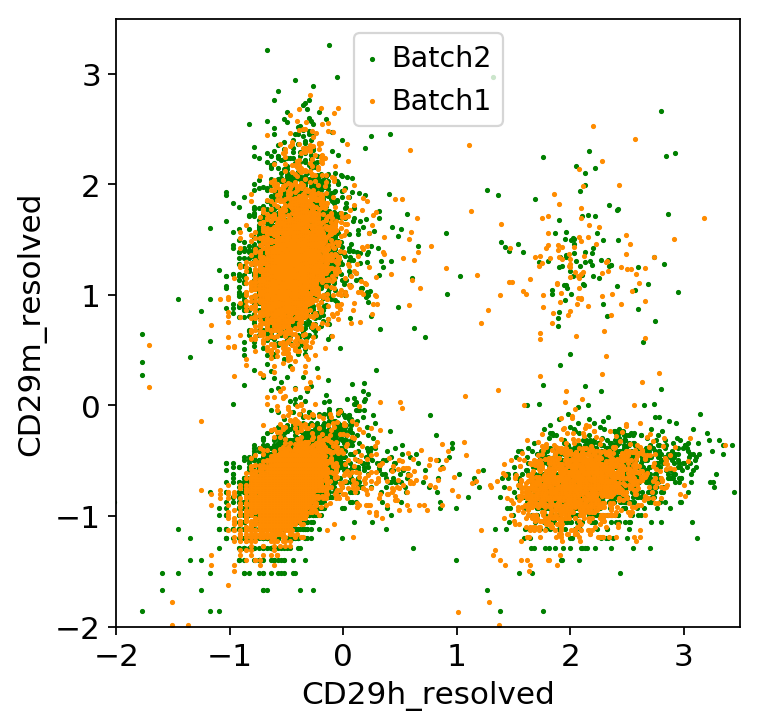

In [49]:
plt.figure(figsize=(5,5))
a=df_log_z_resolved[df_log_z_resolved['Batch']=='Batch1']
b=df_log_z_resolved[df_log_z_resolved['Batch']=='Batch2']

s=sns.scatterplot(x="CD29h_resolved", y="CD29m_resolved", data=b, s=10, marker='.', edgecolor=None, color='green', zorder=1, label="Pool2")
#s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=b, s=10, marker='^', edgecolor='#D53E4F', facecolors='None', zorder=1, label="donor1")
#s=sns.scatterplot(x="CD4h_resolved",  y="CD20h_resolved", data=c, s=10, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Doublets")
s=sns.scatterplot(x="CD29h_resolved", y="CD29m_resolved", data=a, s=10, marker='.', edgecolor=None, color='darkorange', zorder=2, label="Pool1")

plt.xlim(-2,3.5)
plt.ylim(-2,3.5)
s.grid(False)

f = s.get_figure()
f.savefig("191205_v1.1_20K_hm_resolved_batch_group_plot.png")

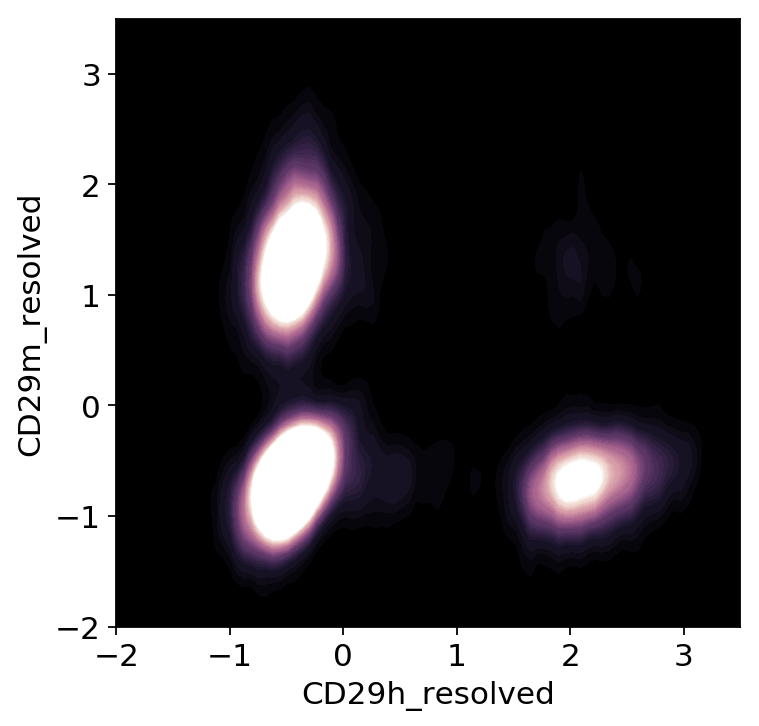

In [50]:
f, ax = plt.subplots(figsize=(5, 5))
cmap = sns.cubehelix_palette(as_cmap=True, dark=0, light=7, reverse=True)


g=sns.kdeplot(df_log_z_resolved.CD29h_resolved, df_log_z_resolved.CD29m_resolved, cmap=cmap, n_levels=300, shade=True);
plt.autoscale(True)
g.set(ylim=(-2,3.5))
g.set(xlim=(-2,3.5))
g.grid(False)

f = g.get_figure()
f.savefig("191205_v1.1_20K_hm_resolved_density_plot.png")

# HTO classify negatives and reload and plot

In [4]:
df_log_z_negative = pd.read_table("191205_negatives_HTO.txt", sep=" ", header=None)

In [5]:
df_log_z_negative.columns = ['cell', 'negatives']

In [6]:
df_log_z_negative.head()

,cell,negatives
0,1,Singlet
1,2,Negative
2,3,Negative
3,4,Singlet
4,5,Singlet


In [11]:
df_fin_resolved = df_log_z_resolved.join(df_log_z_negative['negatives'])

In [12]:
#df_fin_resolved_negative = df_fin_resolved[(df_fin_resolved['negatives'] == 'Singlet') | (df_fin_resolved['negatives'] == 'Doublet') ]
df_fin_resolved.head()

,CD29h_resolved,CD29m_resolved,Batch,Identity,negatives
0,-0.512480,0.859530,Batch1,mm10,Singlet
1,-0.401151,-0.492629,Batch2,mm10,Negative
2,-0.560204,-0.671365,Batch1,mm10,Negative
3,-0.229725,1.591181,Batch2,mm10,Singlet
4,2.106599,-0.642659,Batch1,hg19,Singlet


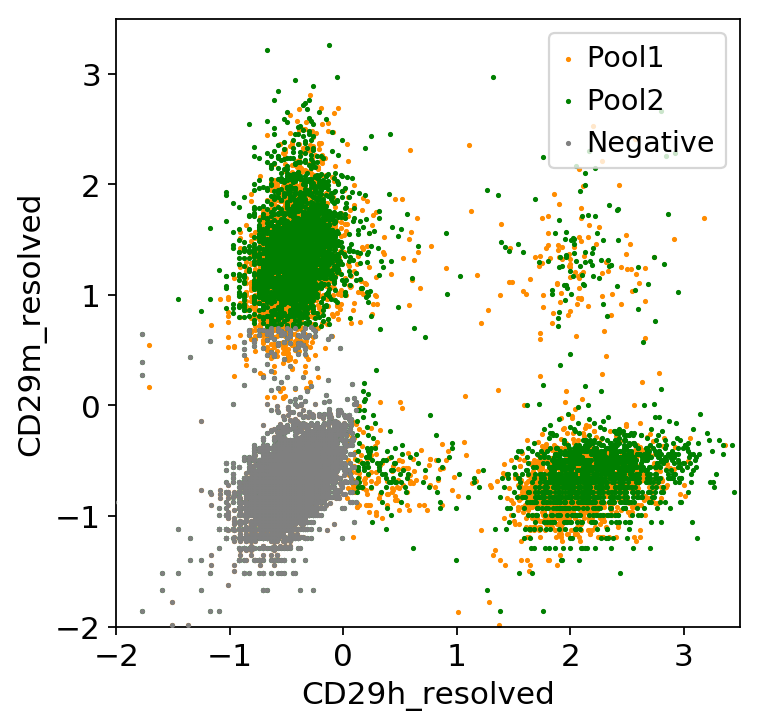

In [63]:
import seaborn as sns

plt.figure(figsize=(5,5))
a=df_fin_resolved[df_fin_resolved['Batch']=='Batch1']
b=df_fin_resolved[df_fin_resolved['Batch']=='Batch2']
c=df_fin_resolved[df_fin_resolved['negatives']=='Negative']

s=sns.scatterplot(x="CD29h_resolved", y="CD29m_resolved", data=a, s=10, marker='.', edgecolor=None, color='darkorange', zorder=1, label="Pool1")
s=sns.scatterplot(x="CD29h_resolved", y="CD29m_resolved", data=b, s=10, marker='.', edgecolor=None, color='green', zorder=2, label="Pool2")
#s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=b, s=10, marker='^', edgecolor='#D53E4F', facecolors='None', zorder=1, label="donor1")
s=sns.scatterplot(x="CD29h_resolved",  y="CD29m_resolved", data=c, s=10, marker='.', edgecolor=None, color='grey', zorder=3, label="Negative")


plt.xlim(-2,3.5)
plt.ylim(-2,3.5)
s.grid(False)

f = s.get_figure()
f.savefig("191205_v1.1_20K_hm_resolved_batch_group_plot.png")


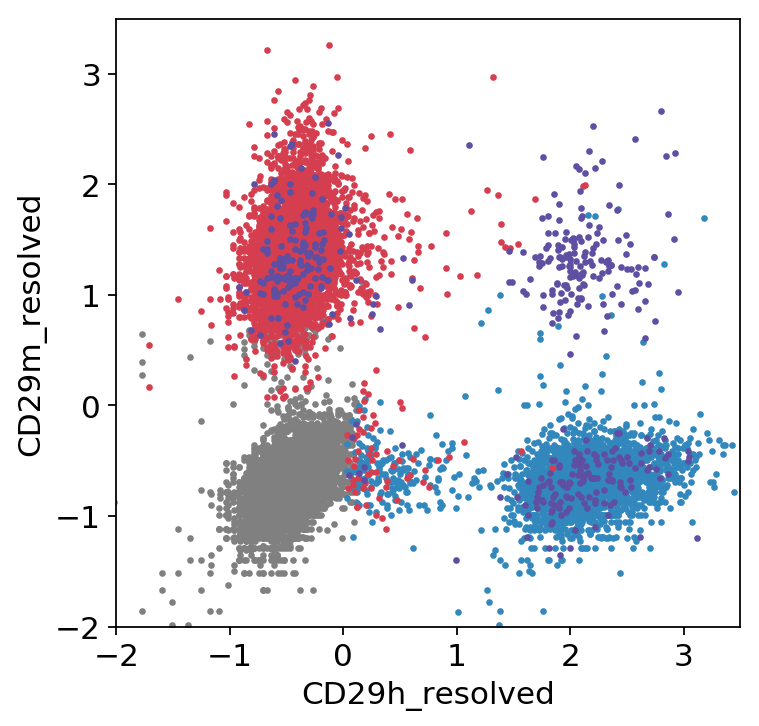

In [11]:
import seaborn as sns

plt.figure(figsize=(5,5))
a=df_fin_resolved[((df_fin_resolved['Identity']=='hg19')&(df_fin_resolved['negatives']=='Singlet')) | ((df_fin_resolved['Identity']=='hg19')&(df_fin_resolved['negatives']=='Doublet'))]
b=df_fin_resolved[((df_fin_resolved['Identity']=='mm10')&(df_fin_resolved['negatives']=='Singlet')) | ((df_fin_resolved['Identity']=='mm10')&(df_fin_resolved['negatives']=='Doublet'))]
c=df_fin_resolved[((df_fin_resolved['Identity']=='Multiplet')&(df_fin_resolved['negatives']=='Singlet')) | ((df_fin_resolved['Identity']=='Multiplet')&(df_fin_resolved['negatives']=='Doublet'))]
d=df_fin_resolved[df_fin_resolved['negatives']=='Negative']

s=sns.scatterplot(x="CD29h_resolved", y="CD29m_resolved", data=a, s=20, marker='.', edgecolor=None, color='#3288BD', zorder=2)
s=sns.scatterplot(x="CD29h_resolved", y="CD29m_resolved", data=b, s=20, marker='.', edgecolor=None, color='#D53E4F', zorder=3)
s=sns.scatterplot(x="CD29h_resolved", y="CD29m_resolved", data=c, s=20, marker='.', edgecolor=None, color='#5E4FA2', zorder=4)
s=sns.scatterplot(x="CD29h_resolved", y="CD29m_resolved", data=d, s=20, marker='.', edgecolor=None, color='gray', zorder=1)


plt.xlim(-2,3.5)
plt.ylim(-2,3.5)
s.grid(False)

f = s.get_figure()
f.savefig("191205_v1.1_20K_hm_resolved_clean_tx_group_plot.png")

In [13]:
df_fin_resolved_negative = df_fin_resolved[(df_fin_resolved['negatives'] == 'Singlet') | (df_fin_resolved['negatives'] == 'Doublet') ]
df_fin_resolved_negative.head()

,CD29h_resolved,CD29m_resolved,Batch,Identity,negatives
0,-0.512480,0.859530,Batch1,mm10,Singlet
3,-0.229725,1.591181,Batch2,mm10,Singlet
4,2.106599,-0.642659,Batch1,hg19,Singlet
6,2.369898,1.004555,Batch1,Multiplet,Doublet
8,-0.409935,1.267893,Batch1,mm10,Singlet


In [14]:
df_fin_resolved_negative.shape

(8783, 5)

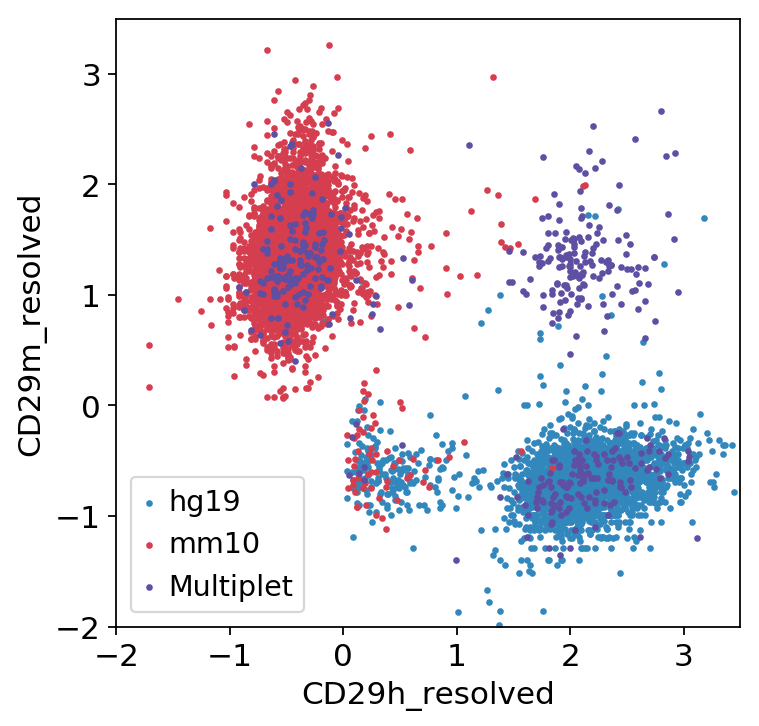

In [44]:
import seaborn as sns

plt.figure(figsize=(5,5))
a=df_fin_resolved_negative[df_fin_resolved_negative['Identity']=='hg19']
b=df_fin_resolved_negative[df_fin_resolved_negative['Identity']=='mm10']
c=df_fin_resolved_negative[df_fin_resolved_negative['Identity']=='Multiplet']
#d=df_fin_resolved_negative[df_fin_resolved_negative['negatives']=='Negative']

s=sns.scatterplot(x="CD29h_resolved", y="CD29m_resolved", data=a, s=20, marker='.', edgecolor=None, color='#3288BD', zorder=1, label="hg19")
s=sns.scatterplot(x="CD29h_resolved", y="CD29m_resolved", data=b, s=20, marker='.', edgecolor=None, color='#D53E4F', zorder=2, label="mm10")
s=sns.scatterplot(x="CD29h_resolved", y="CD29m_resolved", data=c, s=20, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Multiplet")
#s=sns.scatterplot(x="CD29h_resolved", y="CD29m_resolved", data=d, s=20, marker='.', edgecolor=None, color='gray', zorder=3, label="Multiplet")


plt.xlim(-2,3.5)
plt.ylim(-2,3.5)
s.grid(False)

f = s.get_figure()
f.savefig("191205_v1.1_20K_hm_resolved_clean_tx_group_plot.png")

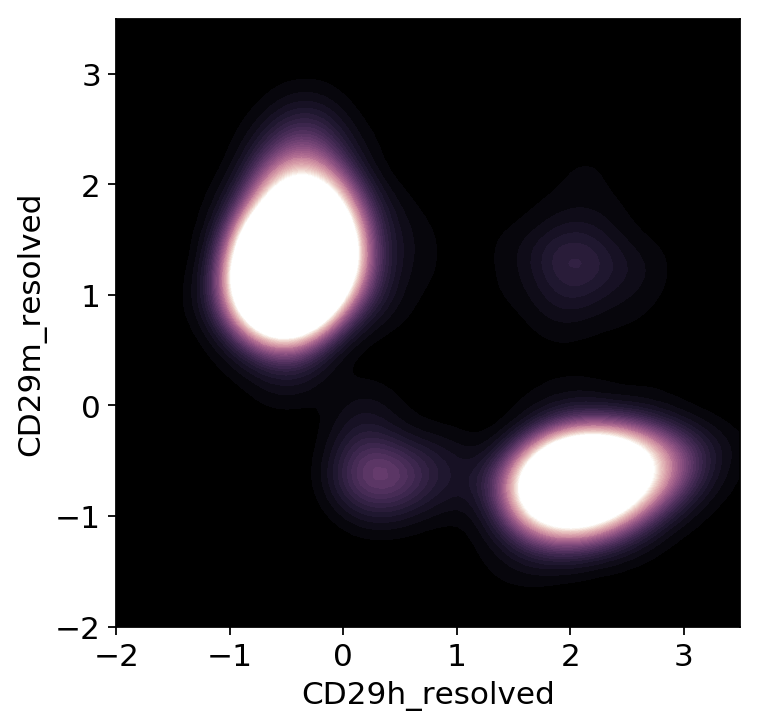

In [59]:
f, ax = plt.subplots(figsize=(5, 5))
cmap = sns.cubehelix_palette(as_cmap=True, dark=0, light=7, reverse=True)


g=sns.kdeplot(df_fin_resolved_negative.CD29h_resolved, df_fin_resolved_negative.CD29m_resolved, cmap=cmap, n_levels=300, shade=True);
plt.autoscale(True)
g.set(ylim=(-2,3.5))
g.set(xlim=(-2,3.5))
g.grid(False)

f = g.get_figure()
f.savefig("191205_v1.1_20K_hm_resolved_density_plot.png")

(0, 7)

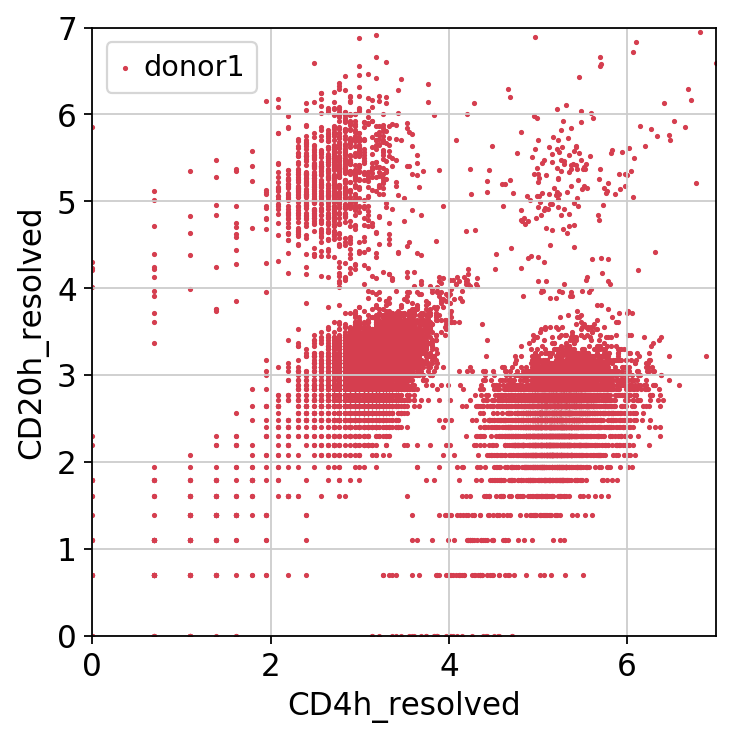

In [90]:
plt.figure(figsize=(5,5))
a=df_log_resolved[df_log_resolved['Identity']=='donor0']
b=df_log_resolved[df_log_resolved['Identity']=='donor1']
c=df_log_resolved[df_log_resolved['Identity']=='doublet']

s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=b, s=10, marker='.', edgecolor=None, color='#D53E4F', zorder=1, label="donor1")
#s=sns.scatterplot(x="CD4h_resolved",  y="CD20h_resolved", data=c, s=10, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Doublets")
#s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=a, s=10, marker='.', edgecolor=None, color='#3288BD', zorder=2, label="donor0")

plt.xlim(0,7)
plt.ylim(0,7)

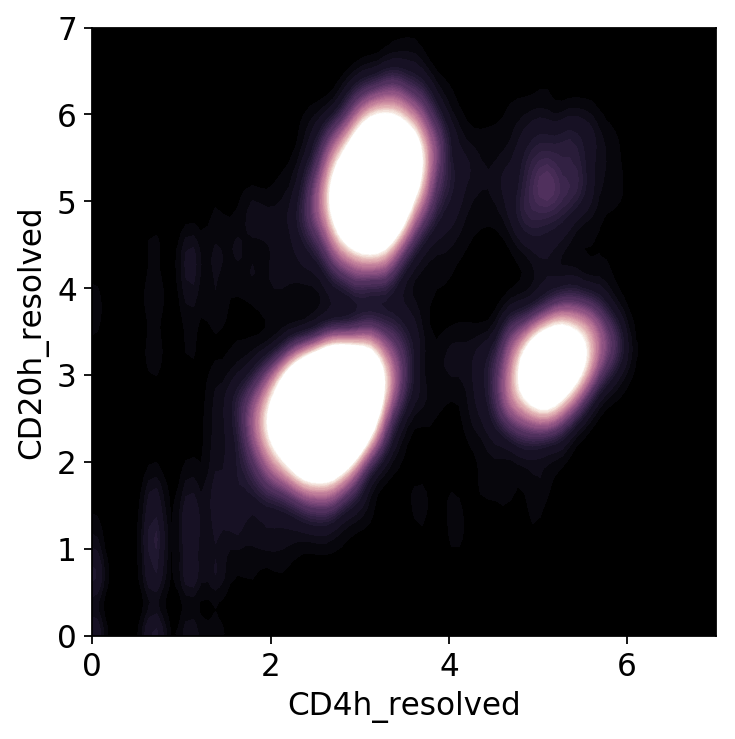

In [87]:
f, ax = plt.subplots(figsize=(5, 5))
cmap = sns.cubehelix_palette(as_cmap=True, dark=0, light=7, reverse=True)

donor0=df_log_resolved[df_log_resolved['Identity']=='donor0']

g=sns.kdeplot(donor0.CD4h_resolved, donor0.CD20h_resolved, cmap=cmap, n_levels=300, shade=True);
plt.autoscale(True)
g.set(ylim=(0,7))
g.set(xlim=(0,7))
g.grid(False)

f = g.get_figure()
f.savefig("191224_v1.1_20K_h_donor0_resolved_density_plot.png")

# Scatter plot using seaborn package here

In [31]:
import pandas as pd
import seaborn as sns

df_ind = cell_adata.obs['IND']

In [243]:
cell_adata

AnnData object with n_obs × n_vars = 16783 × 2905 
    obs: 'DROPTYPE', 'IND', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts'

In [244]:
# call here after you have mrnahv with leiden annotated with cell type (B, T)
cell_adata_mrnahv

AnnData object with n_obs × n_vars = 16783 × 2901 
    obs: 'DROPTYPE', 'IND', 'percent_mito', 'n_counts', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts'
    uns: 'neighbors', 'leiden', 'leiden_colors', 'DROPTYPE_colors', 'leiden-0_colors', 'DROPTYPE-0_colors', 'IND-0_colors'
    obsm: 'X_pca', 'X_umap'

In [245]:
df_celltype = cell_adata_mrnahv.obs['leiden']

In [246]:
df_CD4h_1 = cell_adata[:,'CD3barcode1'].to_df()
df_CD4h_2 = cell_adata[:,'CD3barcode2'].to_df()

df_CD20h_1 = cell_adata[:,'CD20barcode1'].to_df()
df_CD20h_2 = cell_adata[:,'CD20barcode2'].to_df()

df_CD4h_merged = df_CD4h_1.join(df_CD4h_2)
df_CD20h_merged = df_CD20h_1.join(df_CD20h_2)

df_CD4h_merged['CD4_h_merged'] = df_CD4h_merged.sum(axis=1)
df_CD20h_merged['CD20_m_merged'] = df_CD20h_merged.sum(axis=1)

df_CD4_20h_merged = df_CD4h_merged.join(df_CD20h_merged)
#type(cell_adata.obs['call'])
df_CD4_20h_merged = df_CD4_20h_merged.join(cell_adata.obs)

df_CD4_20h_merged.rename(columns = {'CD3barcode1':'CD4barcode1','CD3barcode2':'CD4barcode2'}, inplace = True)

In [247]:
df_CD4_20h_merged.head()

,CD4barcode1,CD4barcode2,CD4_h_merged,CD20barcode1,CD20barcode2,CD20_m_merged,DROPTYPE,IND,percent_mito,n_counts
AAACCCAAGACCGCCT-1,-0.637986,-0.330946,-0.968932,1.808486,0.707370,2.515857,DBL,"donor0,donor1",0.068064,3291.0
AAACCCAAGCAGAAAG-1,0.333345,-1.620865,-1.287520,1.476779,-1.614480,-0.137700,SNG,donor1,0.054556,6837.0
AAACCCAAGTAACGAT-1,-0.116467,2.845206,2.728739,0.743826,-0.044997,0.698829,SNG,donor0,0.141718,1129.0
AAACCCACACCGTCTT-1,1.668994,0.353719,2.022713,0.725244,-0.013834,0.711410,SNG,donor1,0.086374,1343.0
AAACCCACACGGCACT-1,0.480594,-0.852226,-0.371633,-1.410676,0.590422,-0.820254,DBL,"donor0,donor1",0.045088,5700.0


In [229]:
#df_call2 = df_CD4_20_h_merged['IND']
#df_identity2 = df_CD4_20_h_merged['identity']

#df_test_drop2 = df_CD4_20_h_merged.drop(['IND','DROPTYPE','percent_mito'],axis=1)

#df_log1p=df_test_drop2.apply(np.log1p)

#log_znorm_df=(df_log1p-df_log1p.mean())/df_log1p.std()

In [232]:
# adding cell type <-> barcode assignment here
#df_test_drop2.head()

,CD3barcode1,CD3barcode2,CD4_h_merged,CD20barcode1,CD20barcode2,CD20_h_merged,n_counts
AAACCCAAGACCGCCT-1,-0.637986,-0.330946,-0.968932,1.808486,0.707370,2.515857,3291.0
AAACCCAAGCAGAAAG-1,0.333345,-1.620865,-1.287520,1.476779,-1.614480,-0.137700,6837.0
AAACCCAAGTAACGAT-1,-0.116467,2.845206,2.728739,0.743826,-0.044997,0.698829,1129.0
AAACCCACACCGTCTT-1,1.668994,0.353719,2.022713,0.725244,-0.013834,0.711410,1343.0
AAACCCACACGGCACT-1,0.480594,-0.852226,-0.371633,-1.410676,0.590422,-0.820254,5700.0


In [ ]:
#replace_identity_column = df_test_fin_log_z_adt2['identity'].replace({'CD29h-barcode1': 'batch1', 'CD29h-barcode2': 'batch2','CD29m-barcode1': 'batch1', 'CD29m-barcode2': 'batch2',
                         'CD29h-barcode1_CD29m-barcode1':'batch1','CD29h-barcode2_CD29m-barcode2':'batch2' })

In [ ]:
#df_test_fin_log_z_adt2['batch'] = replace_identity_column
df_test_fin_log_z_adt2.to_csv("191205_v1.1_1um_CD29_2batch_log_zscore_add_column_summary_matrix.csv")

# donor 0 plots

In [ ]:
donor0_fin_df = df_fin_adt[df_fin_adt['IND']=='donor0']

(0, 8)

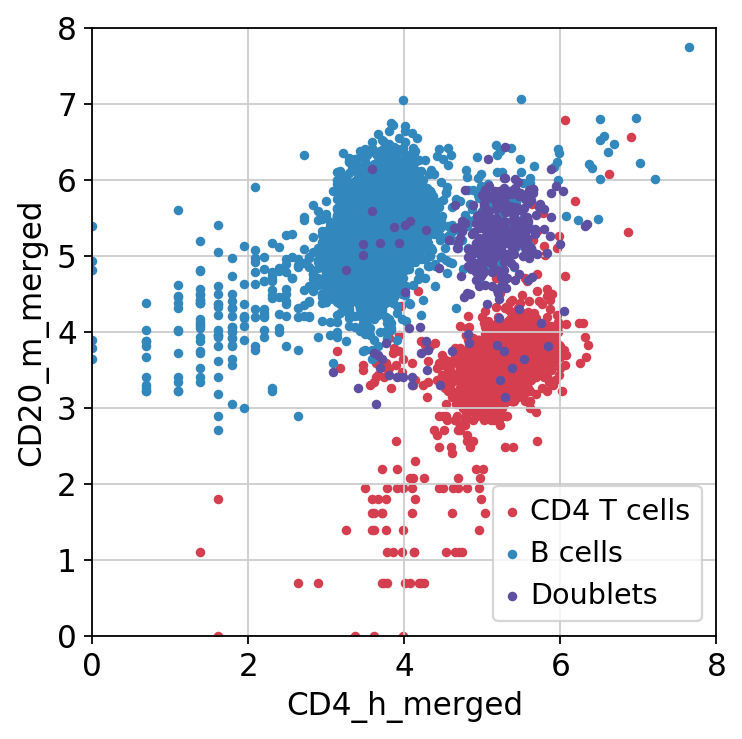

In [194]:
plt.figure(figsize=(5,5))
#recs=[]
#classes = ['CD4 T cells', 'B cells', 'Doublets']
#plt.legend(recs,classes,loc=4)

a=donor0_fin_df[donor0_fin_df['leiden']=='CD4 T cells']
b=donor0_fin_df[donor0_fin_df['leiden']=='B cells']
c=donor0_fin_df[donor0_fin_df['leiden']=='Doublets']
s=sns.scatterplot(x="CD4_h_merged", y="CD20_m_merged", data=a, s=50, marker='.', edgecolor=None, color='#D53E4F', zorder=1, label="CD4 T cells")
s=sns.scatterplot(x="CD4_h_merged", y="CD20_m_merged", data=b, s=50, marker='.', edgecolor=None, color='#3288BD', zorder=2, label="B cells")
s=sns.scatterplot(x="CD4_h_merged", y="CD20_m_merged", data=c, s=50, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Doublets")

plt.xlim(0, 8)
plt.ylim(0, 8)


#ax = sns.scatterplot(x="CD4_h_merged", y="CD20_m_merged", data=donor0_fin_df, hue='leiden',  hue_order=['CD4 T cells', 'B cells', 'Doublets'],  palette=['green','red','purple'], s=10, marker='+')

(0, 8)

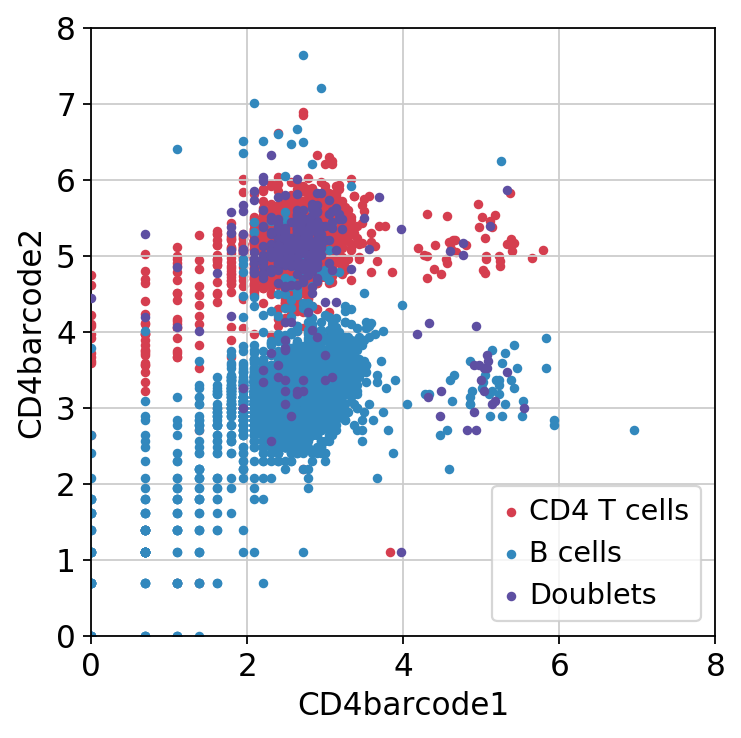

In [195]:
plt.figure(figsize=(5,5))
a=donor0_fin_df[donor0_fin_df['leiden']=='CD4 T cells']
b=donor0_fin_df[donor0_fin_df['leiden']=='B cells']
c=donor0_fin_df[donor0_fin_df['leiden']=='Doublets']
s=sns.scatterplot(x="CD4barcode1", y="CD4barcode2", data=a, s=50, marker='.', edgecolor=None, color='#D53E4F', zorder=1, label="CD4 T cells")
s=sns.scatterplot(x="CD4barcode1", y="CD4barcode2", data=b, s=50, marker='.', edgecolor=None, color='#3288BD', zorder=2, label="B cells")
s=sns.scatterplot(x="CD4barcode1", y="CD4barcode2", data=c, s=50, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Doublets")

plt.xlim(0, 8)
plt.ylim(0, 8)
#ax = sns.scatterplot(x="CD4barcode1", y="CD4barcode2", data=donor0_fin_df, hue='leiden',  hue_order=['CD4 T cells', 'B cells', 'Doublets'],  palette=['#D53E4F','#3288BD','#5E4FA2'], s=50, marker='.', edgecolor=None, zorder=1)
#ax = sns.scatterplot(x="CD4barcode1", y="CD4barcode2", data=donor0_fin_df, hue='leiden',  hue_order=['Doublets', 'CD4 T cells', 'B cells'],  palette=['#5E4FA2','#D53E4F','#3288BD',], s=100, marker='.')

(0, 8)

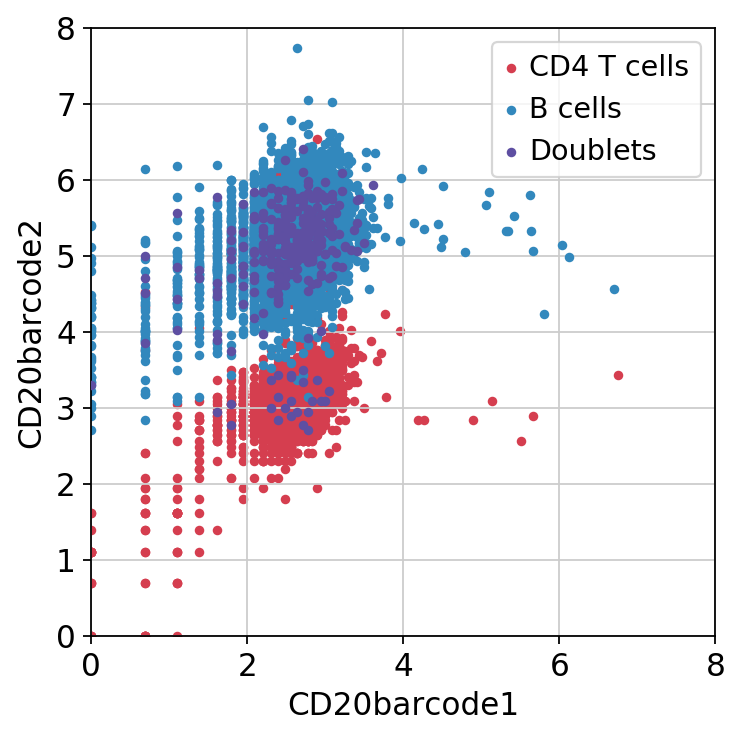

In [196]:
plt.figure(figsize=(5,5))
a=donor0_fin_df[donor0_fin_df['leiden']=='CD4 T cells']
b=donor0_fin_df[donor0_fin_df['leiden']=='B cells']
c=donor0_fin_df[donor0_fin_df['leiden']=='Doublets']
s=sns.scatterplot(x="CD20barcode1", y="CD20barcode2", data=a, s=50, marker='.', edgecolor=None, color='#D53E4F', zorder=1, label="CD4 T cells")
s=sns.scatterplot(x="CD20barcode1", y="CD20barcode2", data=b, s=50, marker='.', edgecolor=None, color='#3288BD', zorder=2, label="B cells")
s=sns.scatterplot(x="CD20barcode1", y="CD20barcode2", data=c, s=50, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Doublets")

plt.xlim(0, 8)
plt.ylim(0, 8)

#ax = sns.scatterplot(x="CD20barcode1", y="CD20barcode2", data=donor0_fin_df, hue='leiden',  hue_order=['CD4 T cells', 'B cells', 'Doublets'],  palette=['green','red','purple'], s=10, marker='+')

# donor 1 plots

In [182]:
donor1_fin_df = df_fin_adt[df_fin_adt['IND']=='donor1']

(0, 8)

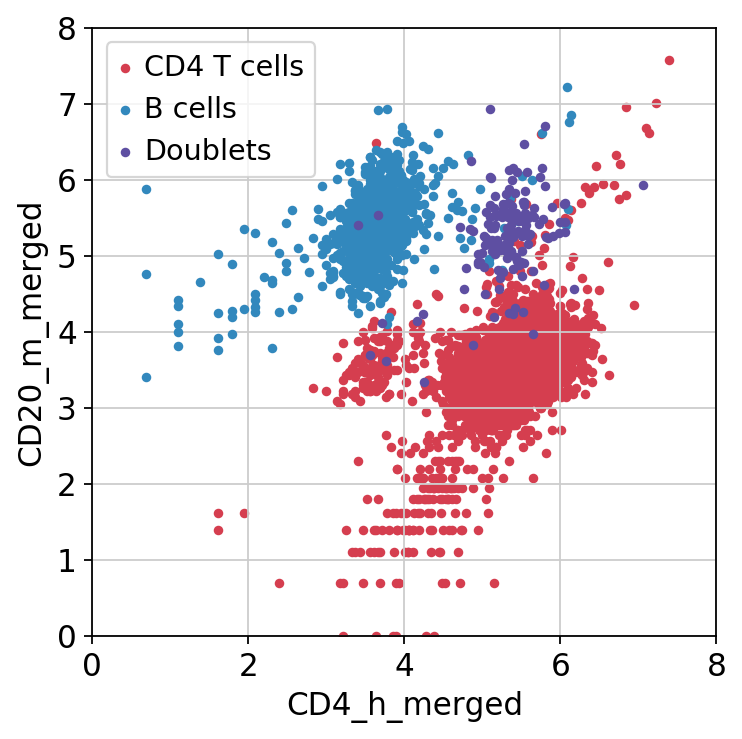

In [197]:
plt.figure(figsize=(5,5))

a=donor1_fin_df[donor1_fin_df['leiden']=='CD4 T cells']
b=donor1_fin_df[donor1_fin_df['leiden']=='B cells']
c=donor1_fin_df[donor1_fin_df['leiden']=='Doublets']
s=sns.scatterplot(x="CD4_h_merged", y="CD20_m_merged", data=a, s=50, marker='.', edgecolor=None, color='#D53E4F', zorder=1, label="CD4 T cells")
s=sns.scatterplot(x="CD4_h_merged", y="CD20_m_merged", data=b, s=50, marker='.', edgecolor=None, color='#3288BD', zorder=2, label="B cells")
s=sns.scatterplot(x="CD4_h_merged", y="CD20_m_merged", data=c, s=50, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Doublets")

plt.xlim(0, 8)
plt.ylim(0, 8)

#ax = sns.scatterplot(x="CD4_h_merged", y="CD20_m_merged", data=donor1_fin_df, hue='leiden',  hue_order=['CD4 T cells', 'B cells', 'Doublets'],  palette=['green','red','orange'], s=10, marker='+')

(0, 8)

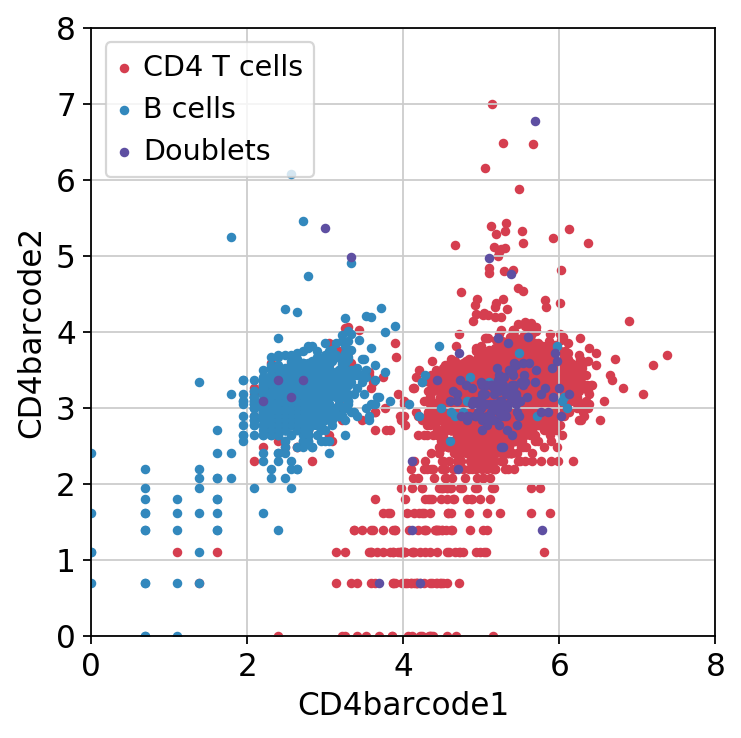

In [198]:
plt.figure(figsize=(5,5))
a=donor1_fin_df[donor1_fin_df['leiden']=='CD4 T cells']
b=donor1_fin_df[donor1_fin_df['leiden']=='B cells']
c=donor1_fin_df[donor1_fin_df['leiden']=='Doublets']
s=sns.scatterplot(x="CD4barcode1", y="CD4barcode2", data=a, s=50, marker='.', edgecolor=None, color='#D53E4F', zorder=1, label="CD4 T cells")
s=sns.scatterplot(x="CD4barcode1", y="CD4barcode2", data=b, s=50, marker='.', edgecolor=None, color='#3288BD', zorder=2, label="B cells")
s=sns.scatterplot(x="CD4barcode1", y="CD4barcode2", data=c, s=50, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Doublets")

plt.xlim(0, 8)
plt.ylim(0, 8)

#ax = sns.scatterplot(x="CD4barcode1", y="CD4barcode2", data=donor1_fin_df, hue='leiden',  hue_order=['CD4 T cells', 'B cells', 'Doublets'],  palette=['green','red','orange'], s=10, marker='+')

(0, 8)

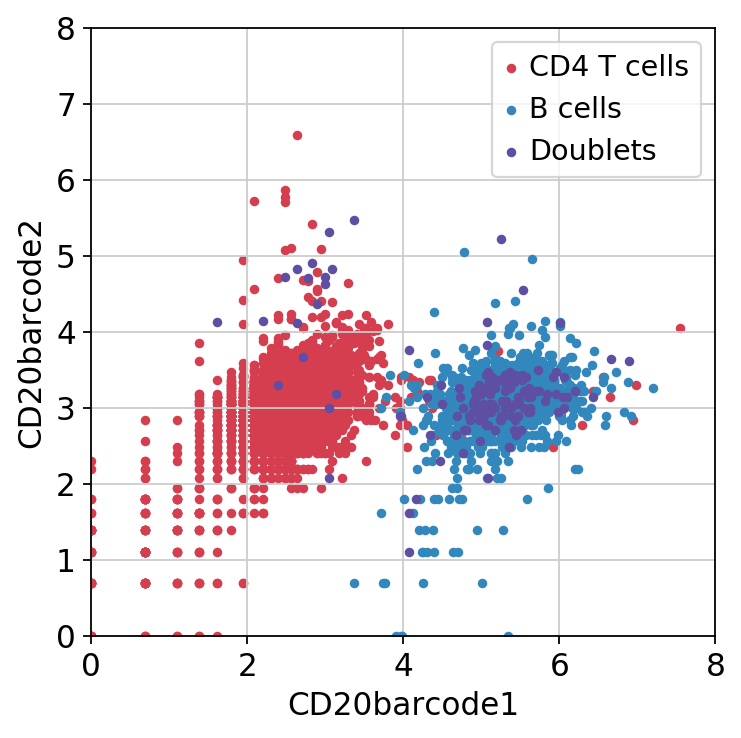

In [199]:
plt.figure(figsize=(5,5))
a=donor1_fin_df[donor1_fin_df['leiden']=='CD4 T cells']
b=donor1_fin_df[donor1_fin_df['leiden']=='B cells']
c=donor1_fin_df[donor1_fin_df['leiden']=='Doublets']
s=sns.scatterplot(x="CD20barcode1", y="CD20barcode2", data=a, s=50, marker='.', edgecolor=None, color='#D53E4F', zorder=1, label="CD4 T cells")
s=sns.scatterplot(x="CD20barcode1", y="CD20barcode2", data=b, s=50, marker='.', edgecolor=None, color='#3288BD', zorder=2, label="B cells")
s=sns.scatterplot(x="CD20barcode1", y="CD20barcode2", data=c, s=50, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Doublets")

plt.xlim(0, 8)
plt.ylim(0, 8)

#ax = sns.scatterplot(x="CD20barcode1", y="CD20barcode2", data=donor1_fin_df, hue='leiden',  hue_order=['CD4 T cells', 'B cells', 'Doublets'],  palette=['green','red','orange'], s=10, marker='+')

In [ ]:
plt.figure(figsize=(5,5))
ax = sns.scatterplot(x="CD20barcode1", y="CD20barcode2", data=donor1_fin_df, hue='leiden',  hue_order=['CD4 T cells', 'B cells', 'Doublets'],  palette=['green','red','orange'], s=10, marker='+')

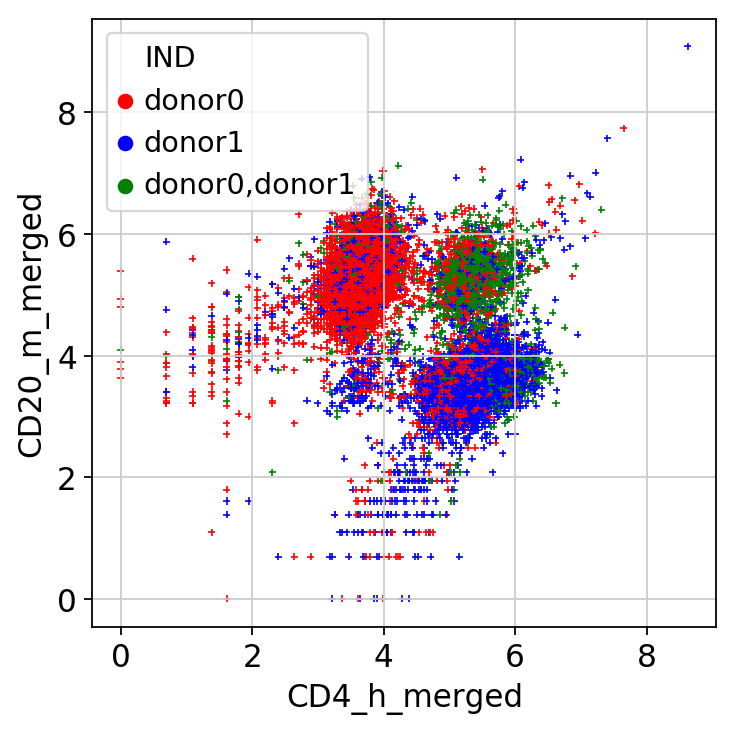

In [39]:
plt.figure(figsize=(5,5))
ax = sns.scatterplot(x="CD4_h_merged", y="CD20_m_merged", data=df_fin_adt, hue='IND',  hue_order=['donor0','donor1','donor0,donor1'],  palette=['red','blue','green'], s=10, marker='+')

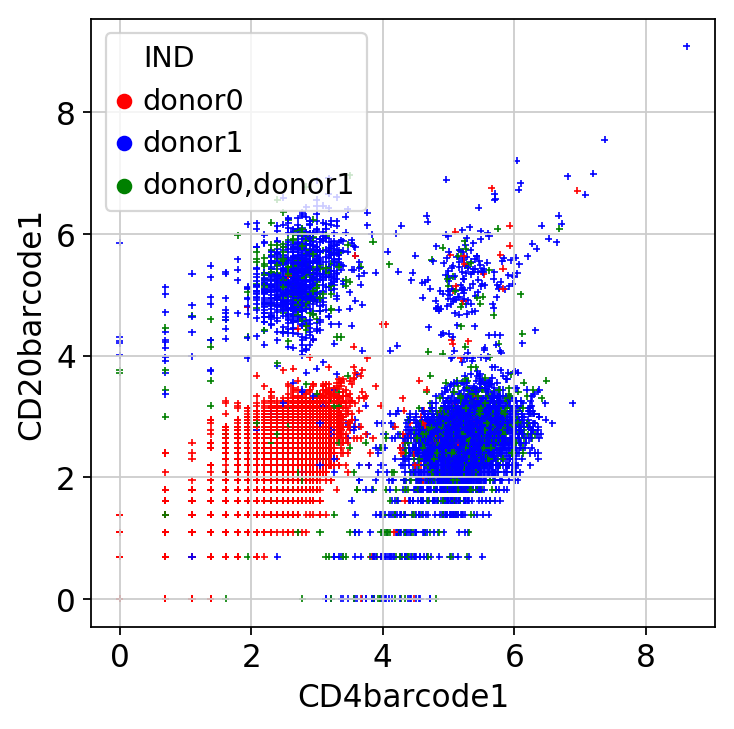

In [40]:
plt.figure(figsize=(5,5))
ax = sns.scatterplot(x="CD4barcode1", y="CD20barcode1", data=df_fin_adt, hue='IND', hue_order=['donor0','donor1','donor0,donor1'], palette=['red','blue','green'], s=10, marker='+')

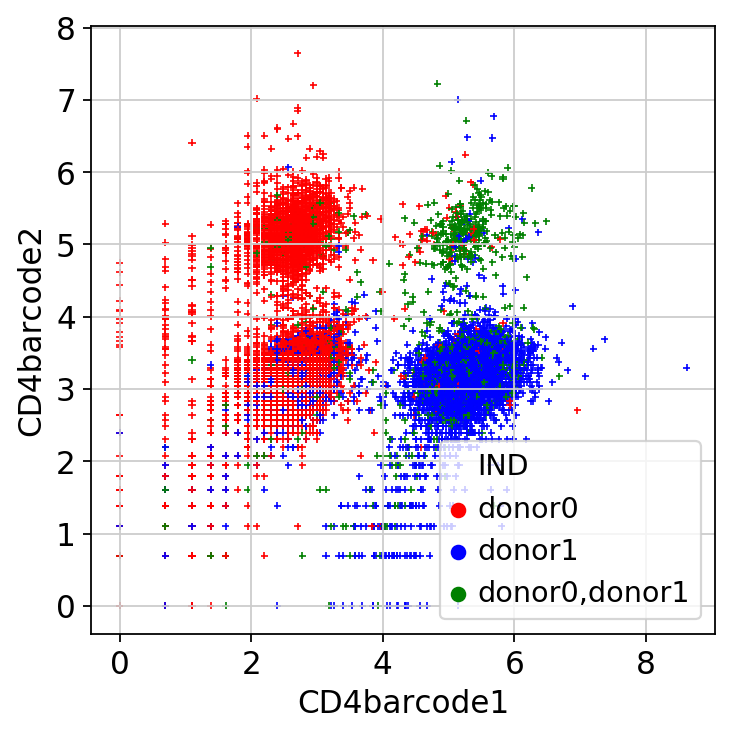

In [41]:
plt.figure(figsize=(5,5))
ax = sns.scatterplot(x="CD4barcode1", y="CD4barcode2", data=df_fin_adt, hue='IND', hue_order=['donor0','donor1','donor0,donor1'], palette=['red','blue','green'], s=10, marker='+')

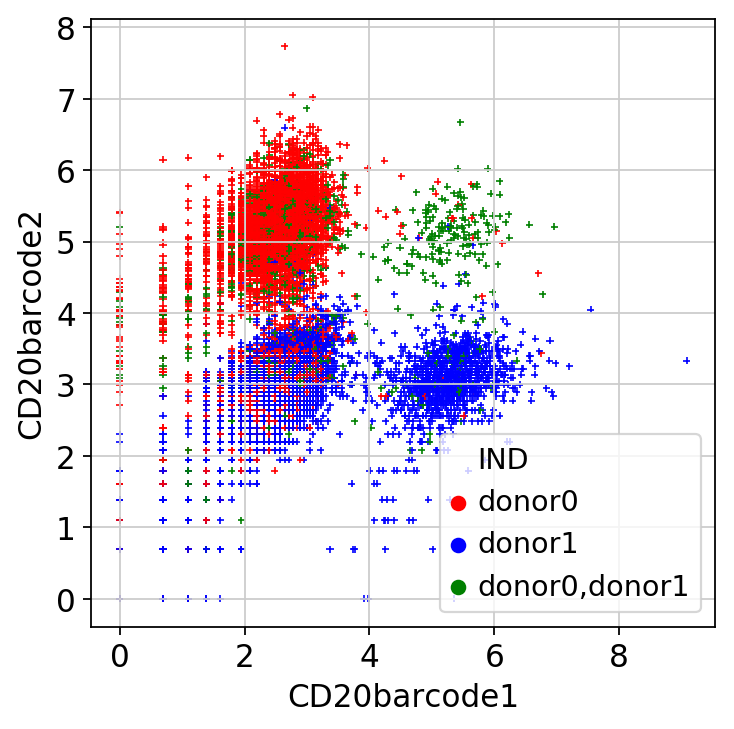

In [42]:
plt.figure(figsize=(5,5))
ax = sns.scatterplot(x="CD20barcode1", y="CD20barcode2", data=df_fin_adt, hue='IND',hue_order=['donor0','donor1','donor0,donor1'],  palette=['red','blue','green'], s=10, marker='+')

# plot UMAP to get the cell type info

In [95]:
cell_adata2 = cell_adata[:,cell_adata.var.index[:-4]]

In [96]:
sc.pp.normalize_per_cell(cell_adata2, counts_per_cell_after=1e4)

normalizing by total count per cell


Trying to set attribute `.obs` of view, copying.


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [97]:
sc.pp.log1p(cell_adata2)

Extract out highly variable genes, but don't subset just yet.

In [98]:
hv_out = sc.pp.highly_variable_genes(cell_adata2, inplace=False)

extracting highly variable genes
    Gene indices [37131] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
    finished (0:00:03)


In [99]:
cell_adata2.var.tail(4)

,gene_ids,feature_types,genome,n_counts
mm10_AC125149.3,mm10_ENSMUSG00000079800,Gene Expression,mm10,5.0
mm10_AC149090.1,mm10_ENSMUSG00000095041,Gene Expression,mm10,3636.0
mm10_CAAA01118383.1,mm10_ENSMUSG00000063897,Gene Expression,mm10,1161.0
mm10_CAAA01147332.1,mm10_ENSMUSG00000095742,Gene Expression,mm10,58.0


In [100]:
keep_genes = cell_adata2.var_names[hv_out['highly_variable']].tolist()
#proteins = ['CD3barcode1', 'CD3barcode2', 'CD20barcode1', 'CD20barcode2']
# proteins = ['CD4-BC1', 'CD4-BC2', 'CD14-BC1', 'CD14-BC2']

Are our proteins highly variable?

In [101]:
#[i in keep_genes for i in proteins]

Regress out unwanted variation.

In [102]:
#cell_adata = cell_adata[:,keep_genes + proteins].copy()
cell_adata2 = cell_adata2[:,keep_genes].copy()

In [103]:
#sc.pp.regress_out(cell_adata,['percent_mito','n_counts'],n_jobs=40)

In [104]:
sc.pp.scale(cell_adata2, max_value=10)

    ... scale_data: as `zero_center=True`, sparse input is densified and may lead to large memory consumption.
    ... clipping at max_value 10


Cluster on just the mRNA and then we'll add our protein markers back later.

In [105]:
cell_adata_mrnahv = cell_adata2[:,keep_genes].copy()
#cell_adata_p = cell_adata[:,proteins].copy()

Begin clustering and dimensionality reduction.

In [106]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(cell_adata_mrnahv,n_neighbors=10) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

computing neighbors
    computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA with n_comps = 50
    finished (0:00:10)
    computed neighbors (0:00:12)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:12)


In [107]:
# resolution to 0.2 for small number of clusters 
sc.tl.leiden(cell_adata_mrnahv,resolution=0.2)

running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [108]:
sc.tl.umap(cell_adata_mrnahv, min_dist=2,gamma=50)

computing UMAP
	completed  0  /  500 epochs


/home/bhwang1/anaconda3/lib/python3.7/site-packages/umap/umap_.py:1052: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))


	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


In [109]:
cell_adata_mrnahv

AnnData object with n_obs × n_vars = 8618 × 10445 
    obs: 'identity', 'percent_mito', 'n_counts', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts'
    uns: 'log1p', 'neighbors', 'leiden', 'umap'
    obsm: 'X_pca', 'X_umap'

... storing 'identity' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


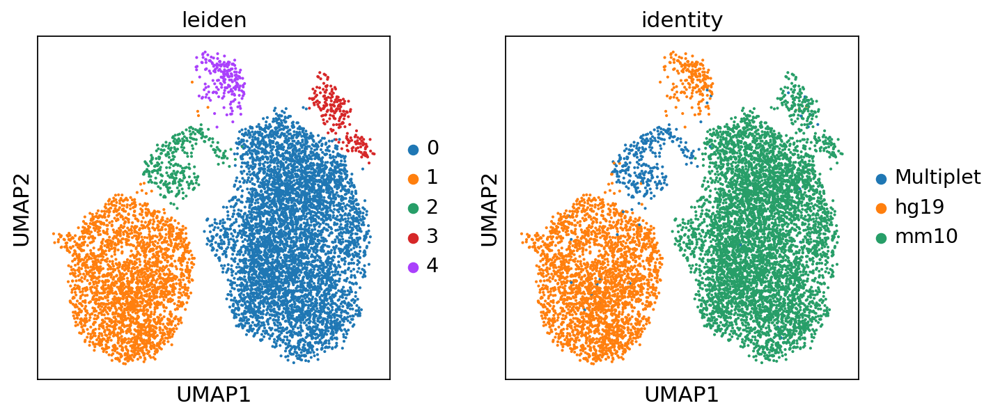

In [110]:
sc.pl.umap(cell_adata_mrnahv,color=['leiden','identity'])
#sc.pl.umap(cell_adata_mrnahv, color=['hg19-ITGB1', 'mm10-Itgb1'], use_raw=False, vmin=0, vmax=2)
#sc.pl.umap(cell_adata, color=['leiden', 'IL7R', 'MS4A1'])

In [40]:
new_cluster_names = ['CD4 T cells','B cells','Doublets']
cell_adata_mrnahv.rename_categories('leiden', new_cluster_names)

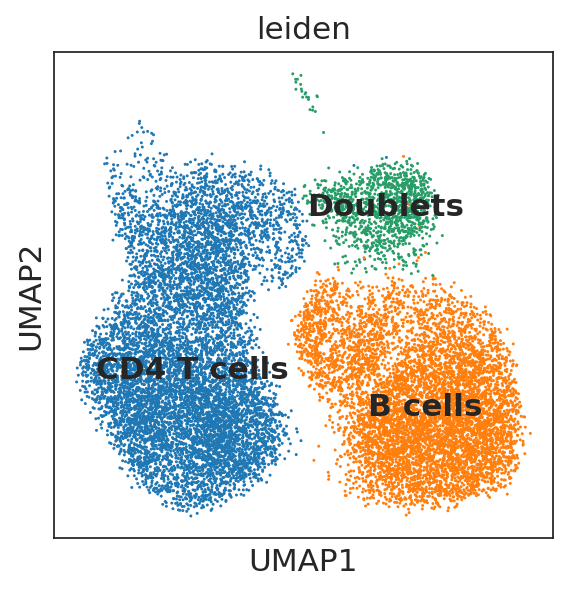

In [41]:
sc.pl.umap(cell_adata_mrnahv, color='leiden', legend_loc='on data')

In [42]:
cell_adata_mrnahv

AnnData object with n_obs × n_vars = 16783 × 2901 
    obs: 'DROPTYPE', 'IND', 'percent_mito', 'n_counts', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts'
    uns: 'log1p', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'DROPTYPE_colors'
    obsm: 'X_pca', 'X_umap'

In [43]:
cell_adata_mrnahv.obs['leiden'].shape

(16783,)

In [44]:
df_cell_type = cell_adata_mrnahv.obs['leiden']

Concatenate back the proteins with the mRNA.

In [78]:
cell_adata_mrnahv.X = csr_matrix(cell_adata_mrnahv.X) # need this to concatenate
cell_adata_comb = cell_adata_mrnahv.T.concatenate(cell_adata_p.T).T.copy()# concatenate along the variables axis

In [58]:
df_fin.head()

,CD29h_barcode1,CD29h_barcode2,CD29_h_merged,CD29m_barcode1,CD29m_barcode2,CD29_m_merged,percent_mito,identity
AAACCCAAGGGTACAC-1,-0.512480,-0.401151,-0.720389,0.859530,-0.492629,0.424492,-1.272825,mm10
AAACCCAAGTCTGCGC-1,-0.560204,-0.229725,-0.652124,-0.671365,1.591181,0.468181,-0.492330,mm10
AAACCCAAGTTGGCGA-1,2.106599,-0.401151,1.547625,-0.642659,-0.385081,-1.105640,1.467543,hg19
AAACCCACAACCGGAA-1,2.369898,-0.319021,1.815377,1.004555,-0.553648,0.594109,0.886876,Multiplet
AAACCCACAGAGTTCT-1,-0.409935,-0.708063,-0.787166,1.267893,-0.929005,0.903473,-0.638725,mm10


In [111]:
a=df_fin['CD29_h_merged'].to_frame()
b=df_fin['CD29_m_merged'].to_frame()
#c=ctype_gmm_df['CD20barcode1'].to_frame()
#d=ctype_gmm_df['CD20barcode2'].to_frame()
merged_adt = a.join([b])
#pgmm.columns=['CD4barcode1','CD4barcode2','CD20barcode1','CD20barcode2']
merged_adt_adata = sc.AnnData(merged_adt)

In [112]:
merged_adt_adata

AnnData object with n_obs × n_vars = 8618 × 2 

# concatenate back the proteins with log_zscore normalized ADT counts

In [113]:
cell_adata_mrnahv.X = csr_matrix(cell_adata_mrnahv.X) 
cell_adata_comb = cell_adata_mrnahv.T.concatenate(merged_adt_adata.T).T.copy()

Keep all the nice unstructured (uns) data and multi-D annotations of observations (obsm).

In [114]:
cell_adata_comb.uns = cell_adata_mrnahv.uns # copy over the umap and leiden data
cell_adata_comb.obsm = cell_adata_mrnahv.obsm # copy over the umap and leiden data

In [115]:
cell_adata_comb.obs.columns

Index(['identity-0', 'percent_mito-0', 'n_counts-0', 'leiden-0'], dtype='object')

In [116]:
cell_adata_comb.var

,batch,feature_types,gene_ids,genome,n_counts
hg19_MTND2P28-0,0,Gene Expression,hg19_ENSG00000225630,hg19,257.0
hg19_MTATP6P1-0,0,Gene Expression,hg19_ENSG00000248527,hg19,15657.0
hg19_SAMD11-0,0,Gene Expression,hg19_ENSG00000187634,hg19,4683.0
hg19_NOC2L-0,0,Gene Expression,hg19_ENSG00000188976,hg19,6330.0
hg19_HES4-0,0,Gene Expression,hg19_ENSG00000188290,hg19,1838.0
...,...,...,...,...,...
mm10_mt-Nd5-0,0,Gene Expression,mm10_ENSMUSG00000064367,mm10,34649.0
mm10_mt-Nd6-0,0,Gene Expression,mm10_ENSMUSG00000064368,mm10,2882.0
mm10_CAAA01118383.1-0,0,Gene Expression,mm10_ENSMUSG00000063897,mm10,1161.0
CD29_h_merged-1,1,NaN,NaN,NaN,NaN


Do some cleanup.

In [81]:
# cell_adata_comb.obs.drop(['DROPTYPE-1','IND-1'],axis=1,inplace=True) # clean up the obs
#cell_adata_comb.obs.columns = ['DROPTYPE-0','IND-0','percent_mito','n_counts','leiden-0','DROPTYPE-1', 'IND-1'] # clean up the obs

In [82]:
#cell_adata_comb.var_names = cell_adata_mrnahv.var_names.tolist() + cell_adata_p.var_names.tolist() # clean up those var names

Visualize!

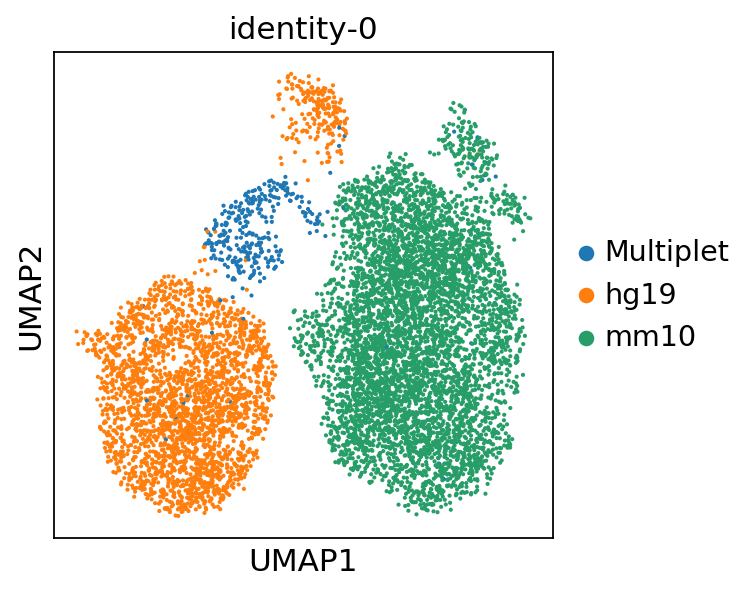

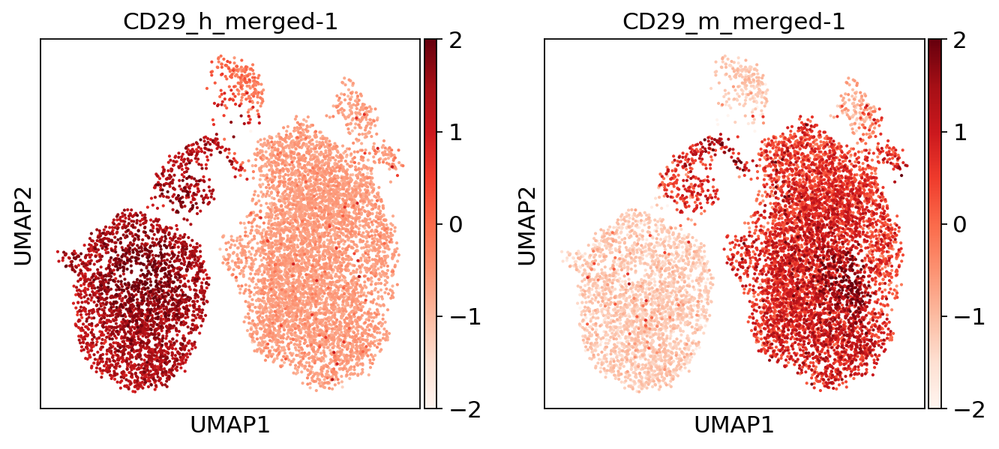

In [118]:
import matplotlib as mpl
#sc.pl.umap(cell_adata_comb,color='leiden-0')
sc.pl.umap(cell_adata_comb,color='identity-0', save="191205_hm_umap_identity.png")
sc.pl.umap(cell_adata_comb,color=['CD29_h_merged-1','CD29_m_merged-1'], vmin=-2, vmax=2,palette="Set2", color_map=mpl.cm.Reds, save="191205_hm_umap_merged_adt.png")
#sc.pl.umap(cell_adata_comb,color='percent_mito-0')
#sc.pl.umap(cell_adata_comb,color='n_counts-0')
#f = g.get_figure()
#f.savefig("191205_hm_umap_plot.png")

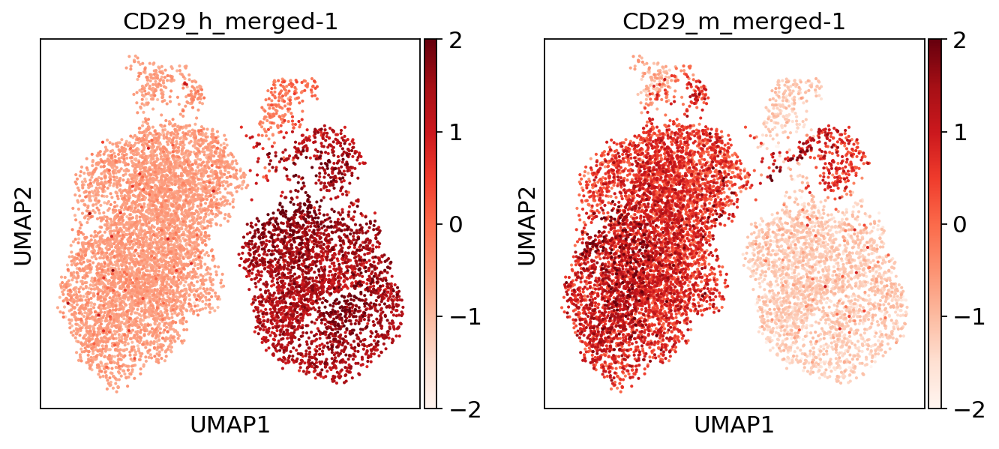

In [73]:
import matplotlib as mpl
sc.pl.umap(cell_adata_comb,color=['CD29_h_merged-1','CD29_m_merged-1'], vmin=-2, vmax=2,palette="Set2", color_map=mpl.cm.Reds)

In [43]:
cell_adata_comb_donor0 = cell_adata_comb[cell_adata_comb.obs['IND-0']=='donor0']
cell_adata_comb_donor1 = cell_adata_comb[cell_adata_comb.obs['IND-0']=='donor1']

In [183]:
cd3_1_donor1 = cell_adata_comb_donor1[:,'CD3barcode1'].X
cd20_1_donor1 = cell_adata_comb_donor1[:,'CD20barcode1'].X
cd3_1_donor0 = cell_adata_comb_donor0[:,'CD3barcode2'].X
cd20_1_donor0 = cell_adata_comb_donor0[:,'CD20barcode2'].X

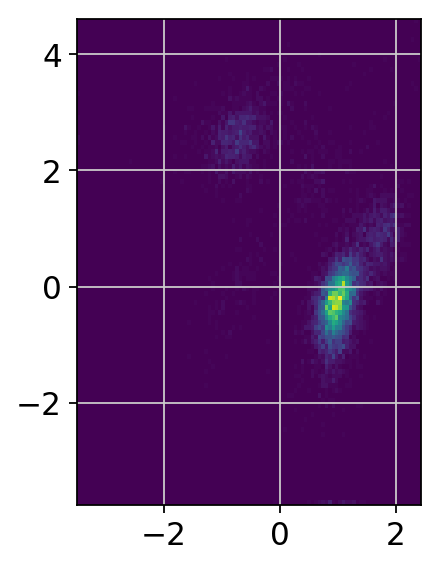

In [184]:
import numpy as np
import numpy.random
import matplotlib.pyplot as plt
# Generate some test data
x = cd3_1_donor1
y = cd20_1_donor1
heatmap, xedges, yedges = np.histogram2d(x, y, bins=100)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
plt.clf()
plt.imshow(heatmap.T, extent=extent, origin='lower')
plt.show()

In [50]:
sc.tl.embedding_density(cell_adata_comb_donor1, basis='umap', groupby=None, key_added='density', components=None)
sc.tl.embedding_density(cell_adata_comb_donor0, basis='umap', groupby=None, key_added='density', components=None)

computing density on 'umap'
--> added
    'density', densities (adata.obs)
    'density_params', parameter (adata.uns)
computing density on 'umap'
--> added
    'density', densities (adata.obs)
    'density_params', parameter (adata.uns)


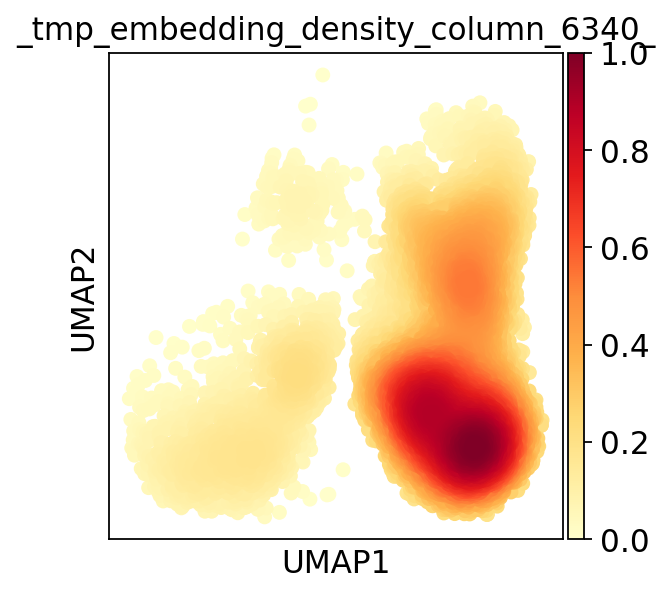

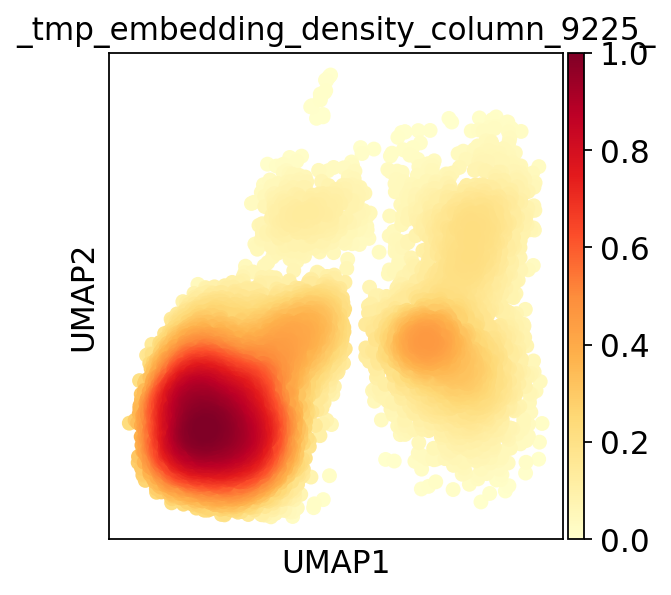

In [51]:
sc.pl.embedding_density(cell_adata_comb_donor1, basis='umap', key='density', group='all', color_map='YlOrRd', bg_dotsize=80, fg_dotsize=180, vmax=1, vmin=0, ncols=4, hspace=0.25, wspace=None, title=None, show=None, save=None, ax=None, return_fig=None)
sc.pl.embedding_density(cell_adata_comb_donor0, basis='umap', key='density', group='all', color_map='YlOrRd', bg_dotsize=80, fg_dotsize=180, vmax=1, vmin=0, ncols=4, hspace=0.25, wspace=None, title=None, show=None, save=None, ax=None, return_fig=None)

In [85]:
#plt.hist([cell_adata_comb_donor1[:,'CD20barcode1'].X], bins = 200, histtype='barstacked')

In [86]:
#plt.hist([cell_adata_comb_donor0[:,'CD20barcode2'].X], bins = 200, histtype='barstacked')

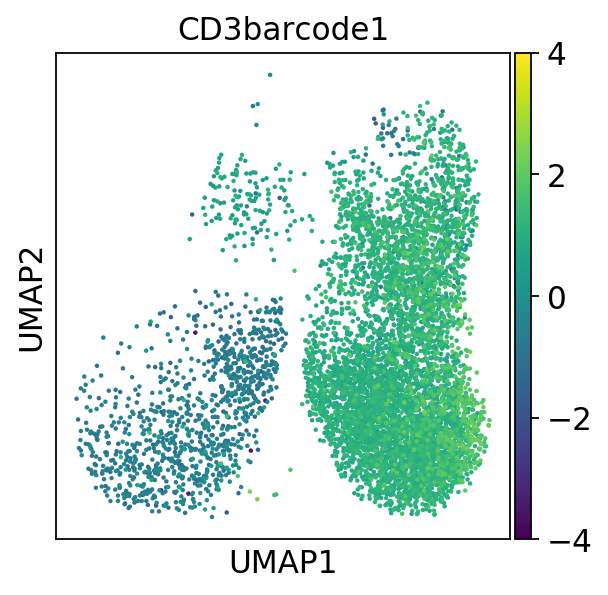

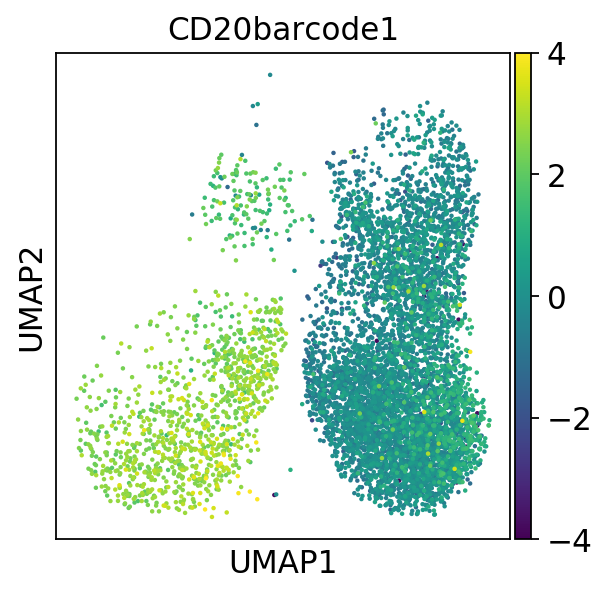

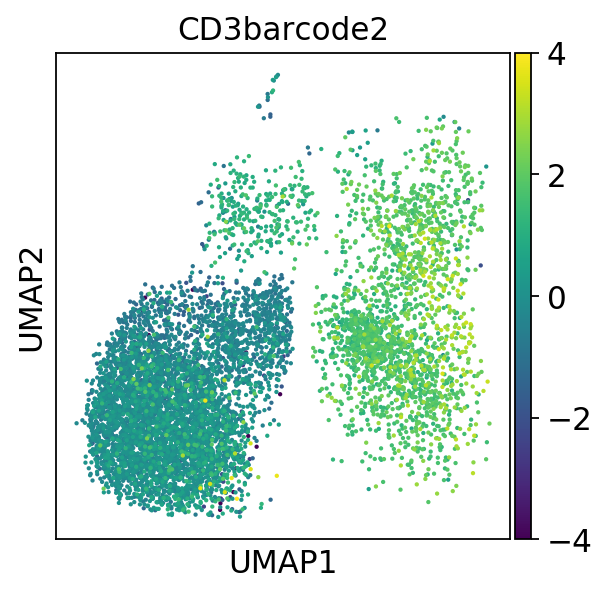

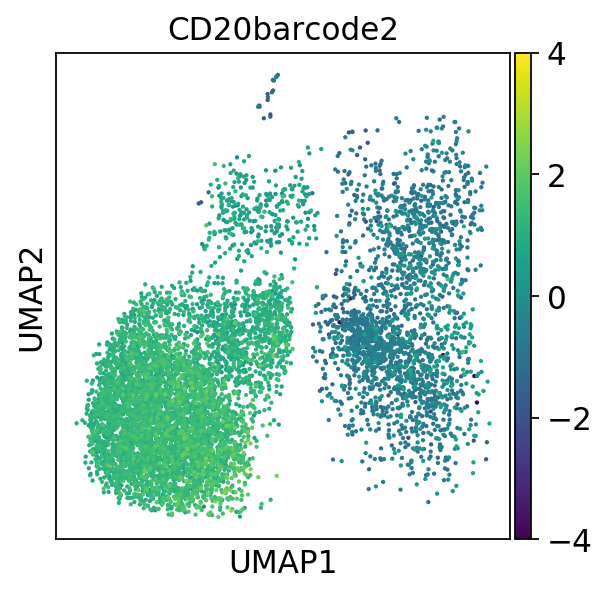

In [58]:
sc.pl.umap(cell_adata_comb_donor1,color='CD3barcode1', vmin=-4, vmax=4)
sc.pl.umap(cell_adata_comb_donor1,color='CD20barcode1', vmin=-4, vmax=4)
sc.pl.umap(cell_adata_comb_donor0,color='CD3barcode2', vmin=-4, vmax=4)
sc.pl.umap(cell_adata_comb_donor0,color='CD20barcode2', vmin=-4, vmax=4)

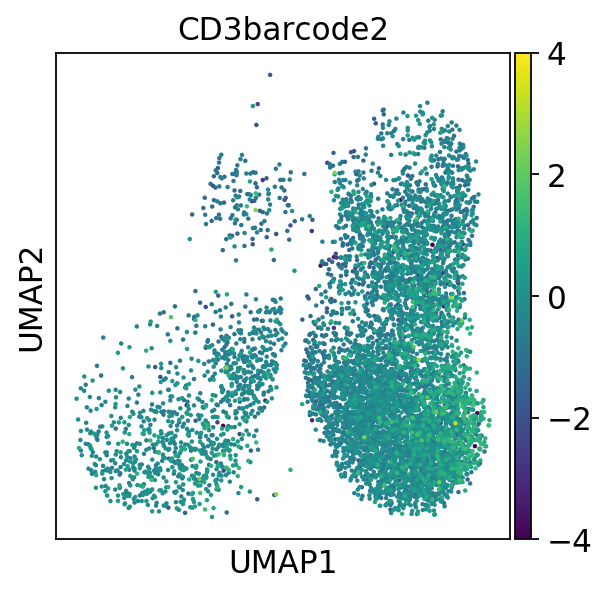

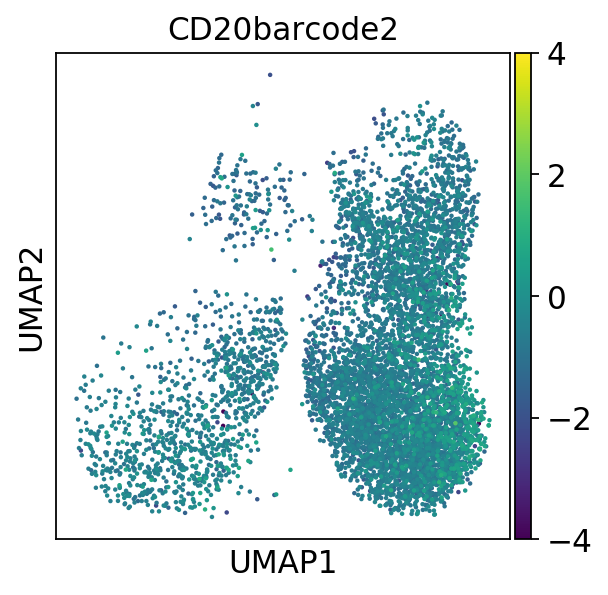

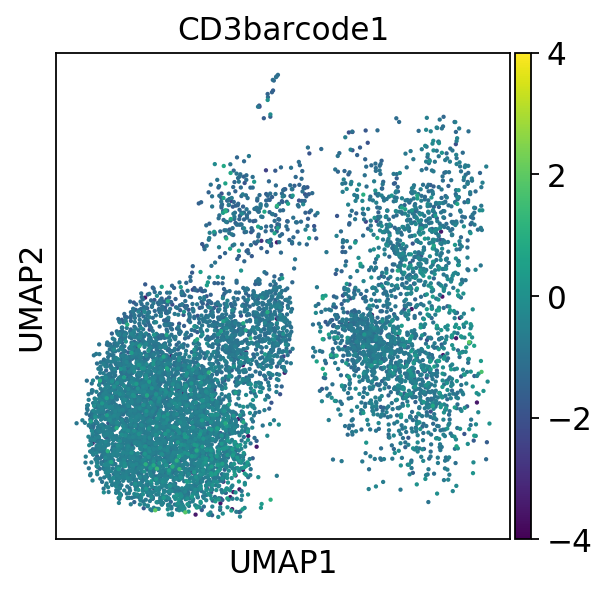

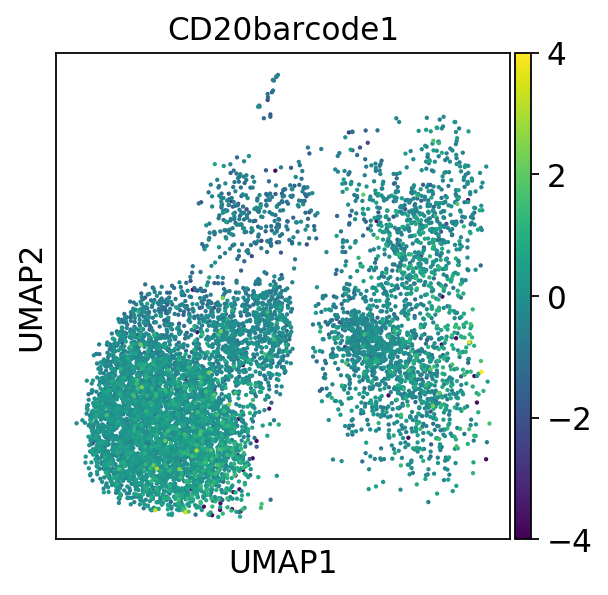

In [59]:
sc.pl.umap(cell_adata_comb_donor1,color='CD3barcode2', vmin=-4, vmax=4)
sc.pl.umap(cell_adata_comb_donor1,color='CD20barcode2', vmin=-4, vmax=4)
sc.pl.umap(cell_adata_comb_donor0,color='CD3barcode1', vmin=-4, vmax=4)
sc.pl.umap(cell_adata_comb_donor0,color='CD20barcode1', vmin=-4, vmax=4)

Cluster based on only two individual

In [64]:
cell_adata_comb_two =cell_adata_comb_sng[(cell_adata_comb_sng.obs['IND']=='IGTB1921')|(cell_adata_comb_sng.obs['IND']=='IGTB1542')]
cell_adata_comb_two_TB = cell_adata_comb_two[(cell_adata_comb_two.obs['leiden-0']=='0')|(cell_adata_comb_two.obs['leiden-0']=='3')|(cell_adata_comb_two.obs['leiden-0']=='4')]

In [65]:
cell_adata_comb_two_TB

View of AnnData object with n_obs × n_vars = 1867 × 1417 
    obs: 'DROPTYPE', 'IND', 'percent_mito', 'n_counts', 'leiden-0'
    var: 'batch', 'feature_types', 'gene_ids', 'genome', 'n_counts'
    uns: 'neighbors', 'leiden'
    obsm: 'X_pca', 'X_umap'

Cluster again with these subset cells (T, B cells for two donors)

In [73]:
sc.pp.neighbors(cell_adata_comb_two_TB,n_neighbors=10)

computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:00)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)


In [74]:
sc.tl.leiden(cell_adata_comb_two_TB,resolution=0.7)

running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [75]:
sc.tl.umap(cell_adata_comb_two_TB,min_dist=2,gamma=50)

computing UMAP
	completed  0  /  500 epochs


/netapp/home/mtphobbes/anaconda3/lib/python3.7/site-packages/umap/umap_.py:1052: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))
/netapp/home/mtphobbes/anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


subset the object by donor here!

In [84]:
cell_adata_comb_two_TB_1542 =cell_adata_comb_two_TB[cell_adata_comb_two_TB.obs['IND']=='IGTB1542']
cell_adata_comb_two_TB_1921 =cell_adata_comb_two_TB[cell_adata_comb_two_TB.obs['IND']=='IGTB1921']

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


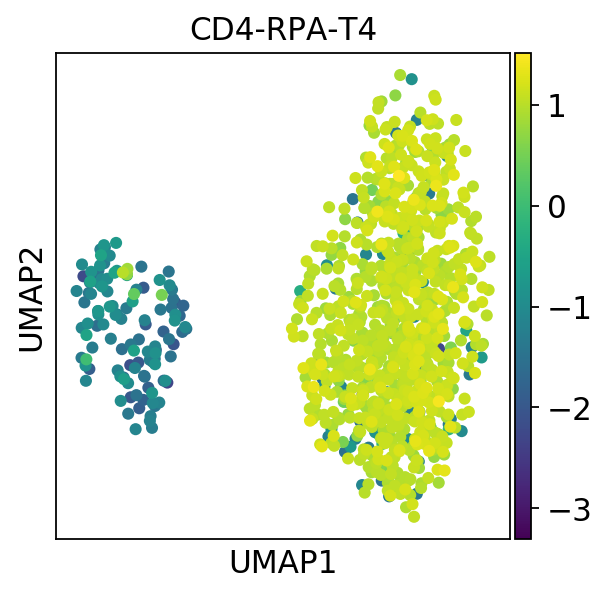

In [85]:
sc.pl.umap(cell_adata_comb_two_TB_1542,color=['CD4-RPA-T4'])

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


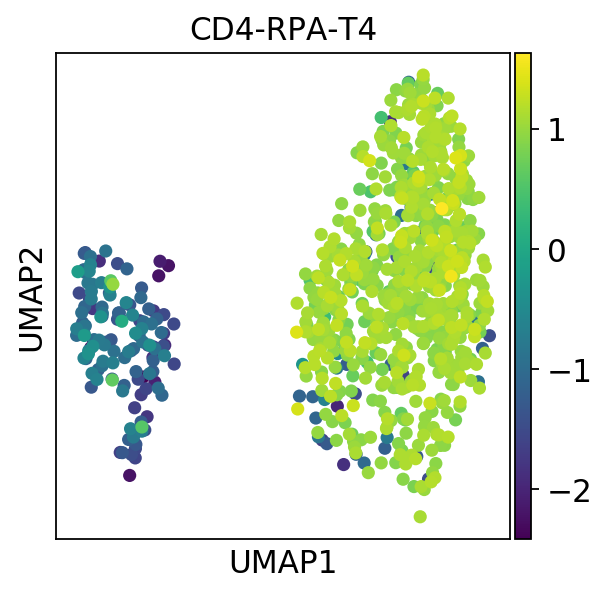

In [86]:
sc.pl.umap(cell_adata_comb_two_TB_1921,color=['CD4-RPA-T4'])

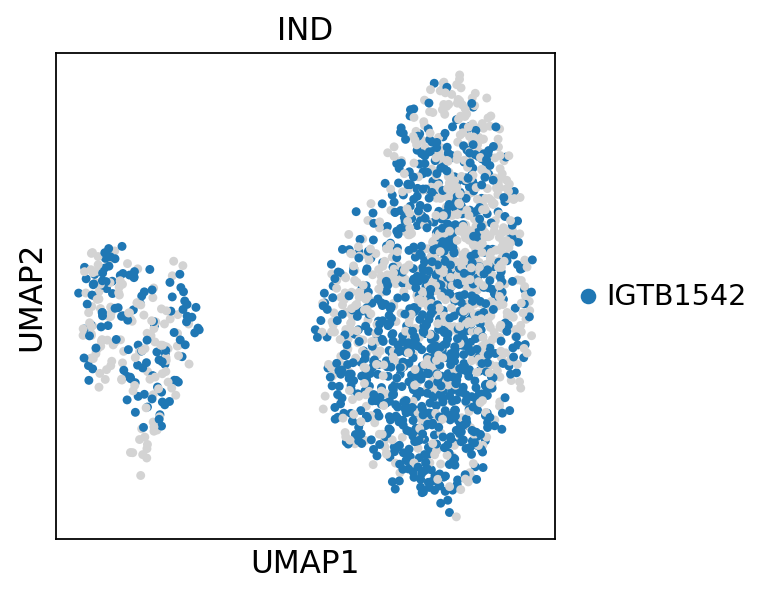

In [81]:
sc.pl.umap(cell_adata_comb_two_TB,color=['IND'], groups=['IGTB1542'])

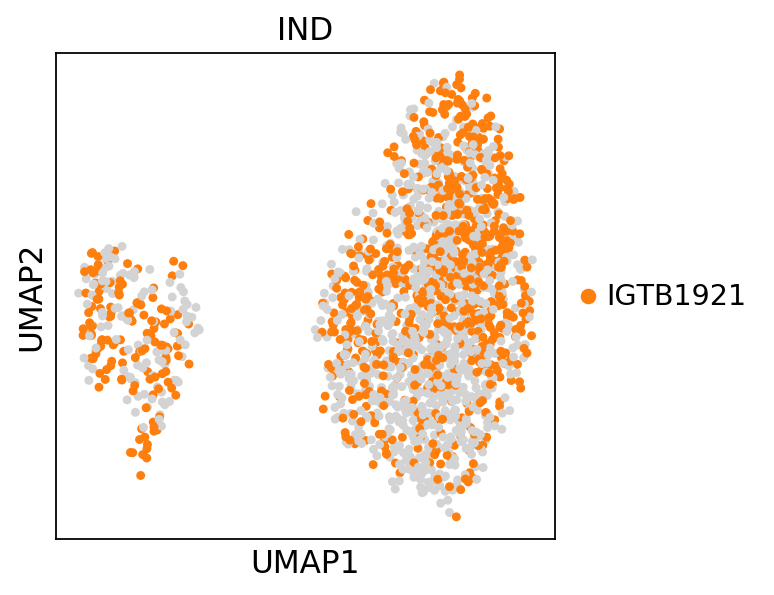

In [82]:
sc.pl.umap(cell_adata_comb_two_TB,color=['IND'], groups=['IGTB1921'])

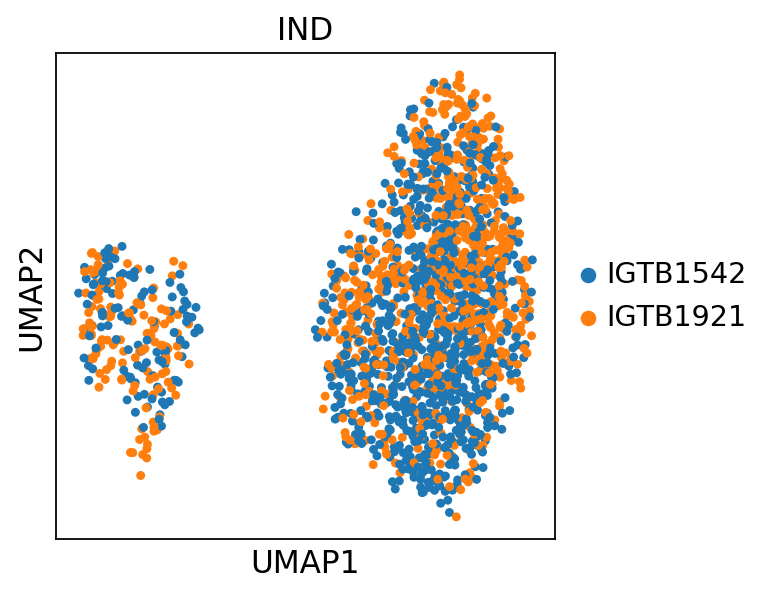

In [79]:
sc.pl.umap(cell_adata_comb_two_TB,color='IND')

In [45]:
cell_adata_mrnahv_two_TB.X = csr_matrix(cell_adata_mrnahv_two_TB.X) # need this to concatenate
cell_adata_comb_two_TB = cell_adata_mrnahv_two_TB.T.concatenate(cell_adata_p.T).T.copy()

Trying to set attribute `.X` of view, making a copy.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


ValueError: You're trying to transpose a view of an `AnnData`, which is currently not implemented. Call `.copy()` before transposing.

In [113]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(cell_adata_mrnahv_two,n_neighbors=10) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

computing neighbors


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


        initialized `.distances` `.connectivities` 
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:00)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)


In [114]:
sc.tl.leiden(cell_adata_mrnahv_two,resolution=0.7)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [115]:
sc.tl.umap(cell_adata_mrnahv_two,min_dist=2,gamma=50)

computing UMAP
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed 

/netapp/home/mtphobbes/anaconda3/lib/python3.7/site-packages/umap/umap_.py:1052: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))
/netapp/home/mtphobbes/anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


 100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


In [117]:
cell_adata_mrnahv_two.X = csr_matrix(cell_adata_mrnahv_two.X) # need this to concatenate
cell_adata_two_comb = cell_adata_mrnahv_two.T.concatenate(cell_adata_p.T).T.copy()# concatenate along the variables axis

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Or pass `index_unique!=None` to `.concatenate`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [120]:
cell_adata_two_comb.uns = cell_adata_mrnahv_two.uns # copy over the umap and leiden data
cell_adata_two_comb.obsm = cell_adata_mrnahv_two.obsm # copy over the umap and leiden data

In [126]:
cell_adata_two_comb.obs

,DROPTYPE-0,IND-0,percent_mito,n_counts,leiden-0,DROPTYPE-1,IND-1
AAACCTGAGAGGTAGA-1,SNG,IGTB1921,0.014409,3470,3,SNG,IGTB1921
AAACCTGAGCCACTAT-1,SNG,IGTB1921,0.019268,3633,0,SNG,IGTB1921
AAACCTGCAGGAACGT-1,SNG,IGTB1921,0.019426,2368,0,SNG,IGTB1921
AAACCTGCATCCCACT-1,SNG,IGTB1921,0.036643,2729,5,SNG,IGTB1921
AAACCTGGTATATGAG-1,SNG,IGTB1921,0.009312,3544,0,SNG,IGTB1921
AAACCTGGTGACAAAT-1,SNG,IGTB1542,0.017643,3174,0,SNG,IGTB1542
AAACCTGGTTCTGGTA-1,SNG,IGTB1542,0.013936,4449,3,SNG,IGTB1542
AAACCTGTCCTAAGTG-1,SNG,IGTB1542,0.021837,2885,0,SNG,IGTB1542
AAACCTGTCGTAGATC-1,SNG,IGTB1542,0.044613,3295,7,SNG,IGTB1542
AAACCTGTCTCCGGTT-1,SNG,IGTB1921,0.009603,3124,0,SNG,IGTB1921


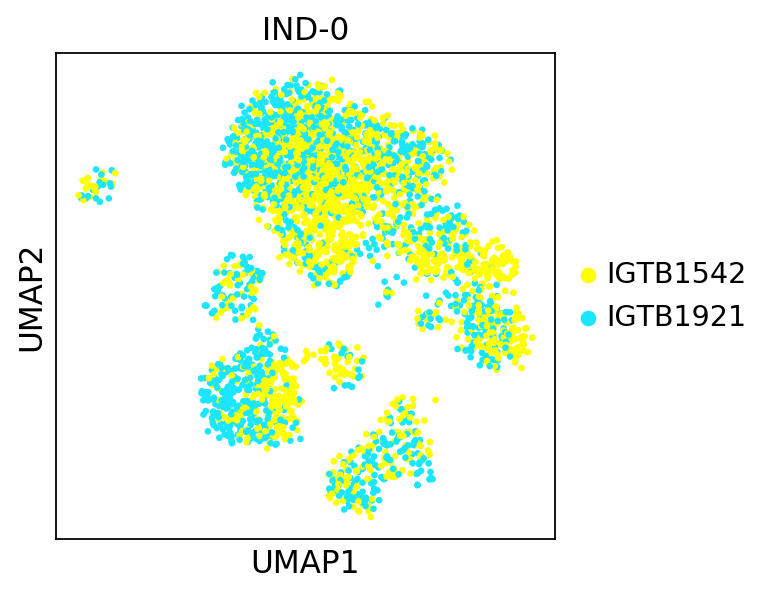

In [139]:
sc.pl.umap(cell_adata_two_comb,color='IND-0')

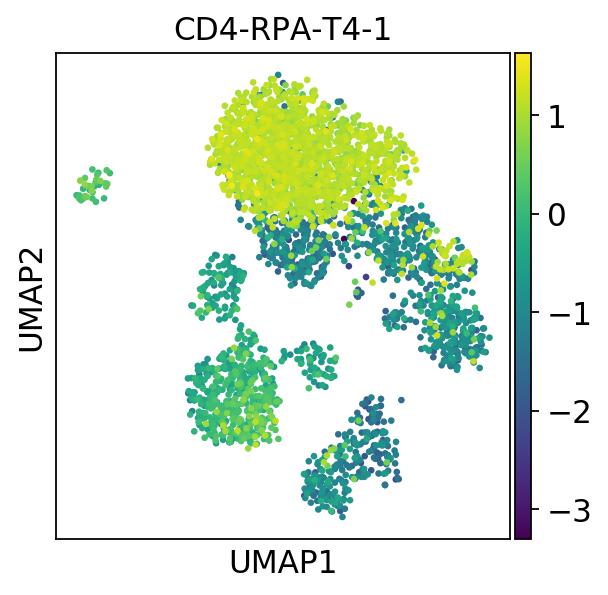

In [125]:
sc.pl.umap(cell_adata_two_comb,color='CD4-RPA-T4-1')

In [129]:
cell_adata_two_comb_sng_1921 = cell_adata_two_comb[cell_adata_two_comb.obs['IND-0']=='IGTB1921']
cell_adata_two_comb_sng_1542 = cell_adata_two_comb[cell_adata_two_comb.obs['IND-0']=='IGTB1542']

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


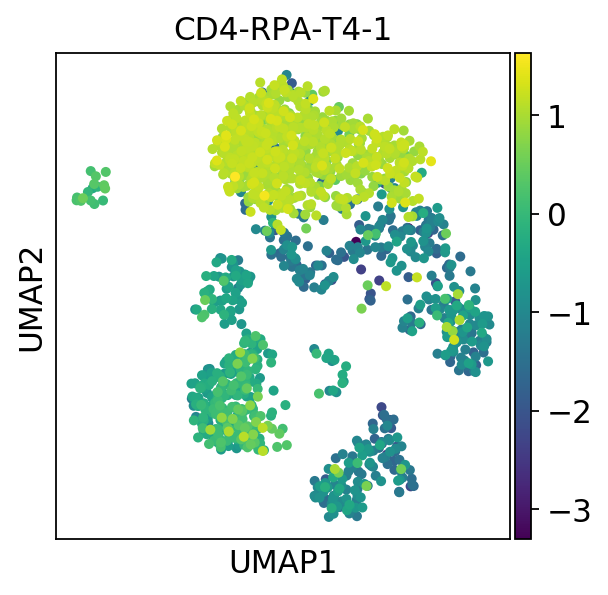

In [130]:
sc.pl.umap(cell_adata_two_comb_sng_1921,color='CD4-RPA-T4-1')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


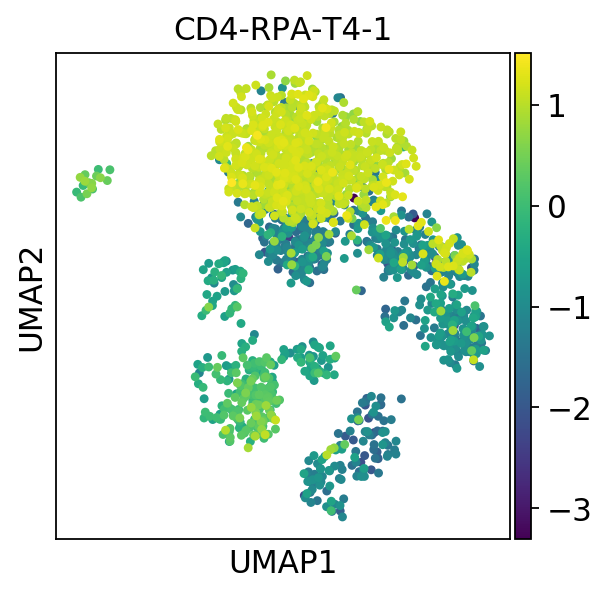

In [131]:
sc.pl.umap(cell_adata_two_comb_sng_1542,color='CD4-RPA-T4-1')

In [93]:
sc.tl.rank_genes_groups(cell_adata_comb,groupby='leiden')

ranking genes
    consider 'leiden' groups: ['0' '1' '2' '3' '4' '5' '6' '7' '8' '9' '10' '11']
    with sizes: [7863 7735 5052 4971 3826  240  187  180  107   62   53   42]


/usr/local/lib/python3.6/dist-packages/scanpy/tools/_rank_genes_groups.py:222: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))
/usr/local/lib/python3.6/dist-packages/scanpy/tools/_rank_genes_groups.py:222: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))
/usr/local/lib/python3.6/dist-packages/scanpy/tools/_rank_genes_groups.py:222: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))
/usr/local/lib/python3.6/dist-packages/scanpy/tools/_rank_genes_groups.py:222: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))
/usr/local/lib/python3.6/dist-packages/scanpy/tools/_rank_genes_groups.py:222: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldc

    finished (0:00:19.06) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids


/usr/local/lib/python3.6/dist-packages/scanpy/tools/_rank_genes_groups.py:222: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))


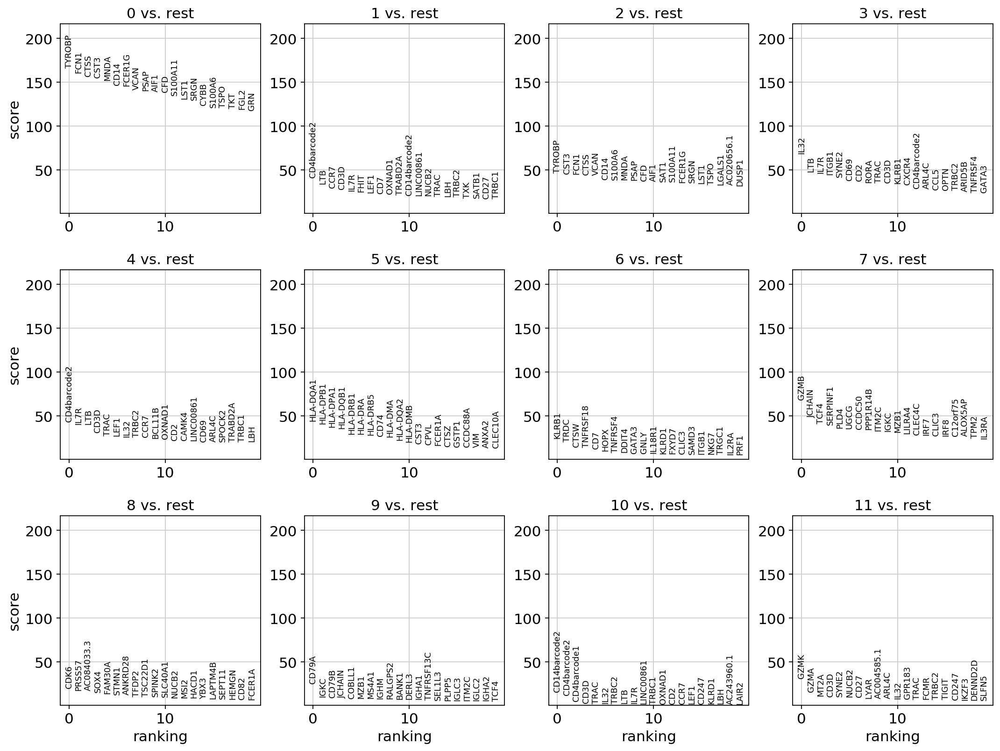

In [94]:
sc.pl.rank_genes_groups(cell_adata_comb,)

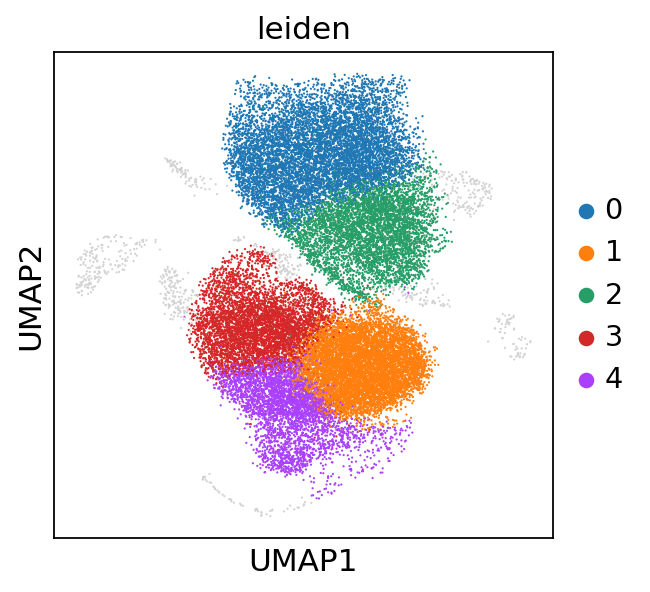

In [95]:
sc.pl.umap(cell_adata_comb,color=['leiden'],groups=[str(i) for i in range(0,5)])

In [96]:
cells_keep_core = cell_adata_comb[cell_adata_comb.obs['leiden'].astype(int) <= 4].obs_names

Going to save cells_keep and rerun a separate notebook with only these cells.

In [97]:
with open(prefix + 'cells.keep.core.txt','w') as file:
    [file.write(i + '\n') for i in cells_keep_core]

In [98]:
print(len(mymux.sngdbl()))
print(len(cell_adata_comb))
print(len(cells_keep_core))

31119
30318
29447
